# fimo global analysis

Doing what we discussed with alireza, we create a 3d matrix that contains cCRE x celltype x motif matrix, might be quite large, let's see how many unique motifs there are

In [80]:
import polars as pl
fimo_results = pl.read_csv('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/modisco/fimo_motifs/fimo.tsv', separator = '\t')

fimo_results = fimo_results.drop(['motif_alt_id', 'string'])
fimo_results.head()

motif_id,sequence_name,start,stop,strand,score,p-value,q-value,matched_sequence
str,str,i64,i64,str,f64,f64,f64,str
"""RREB1_MA0073.1…","""train674547""",856,875,"""-""",30.6606,2.5300e-13,0.000005,"""CCCCAAACCACCCC…"
"""ZNF263_MA0528.…","""train546601""",408,428,"""-""",29.4898,4.9200e-13,0.000003,"""GGAGGAGGAGGAGG…"
"""ZNF263_MA0528.…","""train815986""",406,426,"""-""",29.449,5.9500e-13,0.000003,"""GGAGGAGGAGGAGG…"
"""ZNF263_MA0528.…","""train546601""",411,431,"""-""",29.449,5.9500e-13,0.000003,"""GGAGGAGGAGGAGG…"
"""ZNF263_MA0528.…","""train560044""",974,994,"""+""",29.449,5.9500e-13,0.000003,"""GGAGGAGGAGGAGG…"


In [87]:
fimo_results.tail() #drop th elast 3 rows

motif_id,sequence_name,start,stop,strand,score,p-value,q-value,matched_sequence
str,str,i64,i64,str,f64,f64,f64,str
"""STAT1+STAT2_MA…","""train698185""",952,966,"""-""",8.65152,0.0001,0.213,"""TCAGTTTTATTTTG…"
"""STAT1+STAT2_MA…","""train712608""",990,1004,"""-""",8.65152,0.0001,0.213,"""TCTGTTTTTGTTTT…"
"""# FIMO (Find I…",null,null,null,null,null,null,null,null
"""# The format o…",null,null,null,null,null,null,null,null
"""# fimo --o fim…",null,null,null,null,null,null,null,null


In [91]:
fimo_results = fimo_results[:-3]
fimo_results.tail()

motif_id,sequence_name,start,stop,strand,score,p-value,q-value,matched_sequence
str,str,i64,i64,str,f64,f64,f64,str
"""STAT1+STAT2_MA…","""train708181""",883,897,"""+""",8.65152,0.0001,0.213,"""TCTGTTTTTGTTTT…"
"""STAT1+STAT2_MA…","""train719631""",897,911,"""+""",8.65152,0.0001,0.213,"""GTACTTTCATTTTA…"
"""STAT1+STAT2_MA…","""val46929""",951,965,"""-""",8.65152,0.0001,0.213,"""CAAGTTTCAACTCT…"
"""STAT1+STAT2_MA…","""train698185""",952,966,"""-""",8.65152,0.0001,0.213,"""TCAGTTTTATTTTG…"
"""STAT1+STAT2_MA…","""train712608""",990,1004,"""-""",8.65152,0.0001,0.213,"""TCTGTTTTTGTTTT…"


let's find how many motifs per sequence and the total number of motifs by using groupby, then we can find average amount per sequence

and we can find the average amount per cCRE, plot that histogram

and finally, we can find the total number of motifs! That way we know the size to make our numpy array which will be 10k x 161 x motif#

#the key is we can use these results to find which CREs have some large differences that we can then analyze later, this is crucial and lets us see what to find, alreiza had a great idea!!

In [92]:
#let's find now how many motifs we have first
#let's group by the motif_id column
motif_counts = fimo_results.group_by('motif_id').agg(pl.count('motif_id').alias('count'))
print(motif_counts.shape) #only 575 motifs? not the worst, total of 800 possible tho!
#now sort motif counts
motif_counts = motif_counts.sort('count', descending=True)
motif_counts.head()
#seems we have 572 total!!

(572, 2)


motif_id,count
str,u32
"""ZNF384_MA1125.…",56386
"""ZNF263_MA0528.…",48240
"""IRF1_MA0050.2""",25490
"""EWSR1-FLI1_MA0…",23400
"""SP2_MA0516.1""",12747


Text(0.5, 1.0, 'Histogram of motif counts')

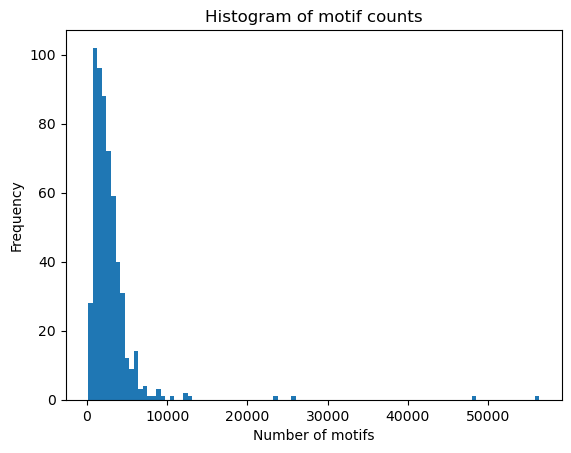

In [99]:
#let's now make this a histogram
motif_counts_np = motif_counts.to_numpy()
#now plot
import matplotlib.pyplot as plt
plt.hist(motif_counts_np[:,1], bins=100)
plt.xlabel('Number of motifs')
plt.ylabel('Frequency')
plt.title('Histogram of motif counts')

In [110]:
#let's now group by the sequence name
seq_counts = fimo_results.group_by('sequence_name').agg(pl.count('sequence_name').alias('count'))
seq_counts = seq_counts.sort('count', descending=True)
print(seq_counts.shape) #so this includes our now N value that we ignored, yeah makes sense, but it has a lot of N in it!
seq_counts.head()

(10000, 2)


sequence_name,count
str,u32
"""train565687""",1297
"""train145444""",1133
"""train599375""",915
"""train637590""",887
"""val72674""",778


Text(0, 0.5, 'Number of CCREs')

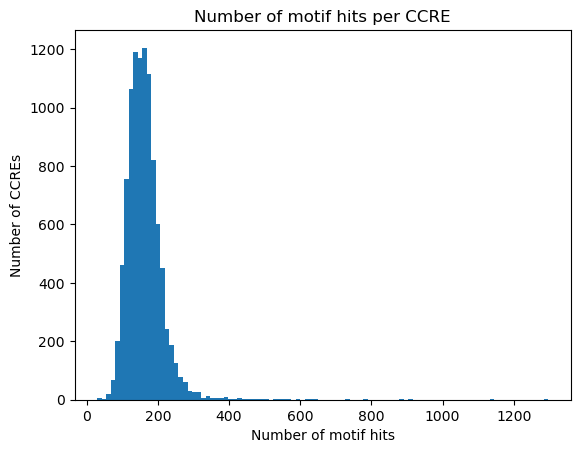

In [98]:
#make a histogram of it
seq_counts = seq_counts.to_numpy()
#and now plot histogram
import matplotlib.pyplot as plt
plt.hist(seq_counts[:,1], bins=100)
plt.title('Number of motif hits per CCRE')
plt.xlabel('Number of motif hits')
plt.ylabel('Number of CCREs')
#number of motif hits per ccre!

What to do?
now that we have this data, we can make a loop that does this per celltype. A key idea is that we need to make sure the sequences are the same, then extract the data

1) load in the sequence
2) find every individual motif hit, if multiple hits, then we keep the best one only
3) find the highest absolute value of the average over every motif and 5 more on either side. Take that single number and store it in the tensor

need to ask gpt if this makes sense and what the bes approach is

In [101]:
#the total size will be 10000 x 572 x 161, which is very reasonable to hold in memory
#let's now create a tensor to hold the motif hits
import numpy as np
fimo_summary = np.zeros((10000, 572, 161), dtype=np.float32)
#now see how much space it takes in gb
print(fimo_summary.nbytes / 1e9)
#we could make it float 16 or 32 if there's an issue, but for now 32 seems fine

3.68368


# the plan
so here's what happens, we go through each sequence, make sure the sequence aligns, then we go through each motif in the sequence, and gather all celltypes simultaneously, can just average it. Then we assign it to our large matrix and move on

In [3]:
#let's do this for the first sequence
#first check size of plars df
import sys
bytes_data = fimo_results.estimated_size()
print(bytes_data / 1e9) #.2 GB, this is not a concern at all!

NameError: name 'fimo_results' is not defined

In [4]:
#now let's load in the first sequence as we did for FIMO in the first place
#we don't need trainidx either, can loop through the files direclty since we need to load them in regardless
#but if we do use them, the one to ignore is 752763, verified it in the fasta and in the ISM4 file!
import numpy as np
train_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/train_idx.npy')
val_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/val_idx.npy')
test_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/test_idx.npy')
print(train_idx.shape, val_idx.shape, test_idx.shape, sum([train_idx.shape[0], val_idx.shape[0], test_idx.shape[0]]))

#remove the 752763 index from train_idx
train_idx = train_idx[train_idx != 752763]
print(train_idx.shape, val_idx.shape, test_idx.shape, sum([train_idx.shape[0], val_idx.shape[0], test_idx.shape[0]]))
#works as expected!

(8396,) (830,) (774,) 10000
(8395,) (830,) (774,) 9999


In [5]:
#now that we have it, we can access some of the data!
import pandas as pd
#read train.csv
train = pd.read_csv('/data/leslie/sarthak/data/train.csv')
train = train.to_numpy()
train_seqs = train[train_idx,2]
print(train_seqs.shape)

(8395,)


In [6]:
print(train_idx)

[716808 784800 645332 ... 616768 616882 616657]


In [7]:
#now we can access the first sequence
train_seqs[0]

'caTATCTGAACTACACTGAATTTGCTTTTTCAAGTGGGGAGAAAAATCATTTATAAGACACCCAAGGAAAAGTCCTAAGAAACTGGATACCCCAACTATTAATCATTAATTAAGCATCTACTTAATACCTGTTAGGTGTTCTGTGCTTTTCACTAAGCATACAAAACTCCTGCTTTTAATAGCTTATAGGTCTTGAATGCCCTCTCAATGTTTCTGAggccaaattaaataaaaaatgcaaattctaaaATCCTAAAACTaccacttctgttttctttcaaatattcacAAAGGGTaaaatccatttttataaatTCCACTATAATAAATATAACTAACAGAACCACTGATGTGTATCAATTCAAAATGATTTTATGATAATTGTATACATTAGATTTGATAAATGTGCTATTTTCTGACTCCAggcagaatatttgaaaataaaaaattactttacaGAAACTATCTATACTAGTTCATACCAGAAACTATACCAAAACCACATCAAGTTTCTCTAACACATTGTCTATTGCAAATGAACctgaacaaacaaaaatgtaagtgAAACTCACTTTATTACCATGATCAGAGTCTTCATTCATCTATTGTAAGATAGTCCAGACAAACCACTTTATGCAGGTTAGAAAATGTCACAAATGTAATAGGTTTGATTCTTAAAGAAATCAATTAacttcaaataagaaaaatgagttCTGTTCCTAGCTATTAATTAcaccaatttctctcattttgtaaaatgtaaataccaTTCAAGAGGGTCTCCATAGTTCACTTATGAAACCTCATTGCTCCAAGAAAAAATTCCAATGCATACAAAATTGTCATTAATTATACAAGGTAATTAACTCCATCTCTGTATAAgaaattaataagtatttattaagtgaACAGTTAGAACTATGAAAccaatgtattttctcttctcaaGGTACAATCAATGTGTgacaaagttttttttgttgttattaaggCACTTTG

In [8]:
#let's verify the sequence is correct through the dataset and through the ISM results!
from shap_analysis.ism_utils import ISMUtils
ctst_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-25/15-41-13-286486/checkpoints/last.ckpt'
utils = ISMUtils('DNase_ctst', ctst_path, classification=True, split='train')
#the first one is 716808, so let's check taht dataset, be sure to multiply by 161 since it's ctst


In [9]:
seq = utils.dataset[716808 * 161][0]
print(seq)

tensor([12,  8,  7,  ...,  7,  7,  9])


In [10]:
print(utils.dataset.tokenizer.decode(seq[1:]))
#of course a perfect match! That means we can easily just replace 

CATATCTGAACTACACTGAATTTGCTTTTTCAAGTGGGGAGAAAAATCATTTATAAGACACCCAAGGAAAAGTCCTAAGAAACTGGATACCCCAACTATTAATCATTAATTAAGCATCTACTTAATACCTGTTAGGTGTTCTGTGCTTTTCACTAAGCATACAAAACTCCTGCTTTTAATAGCTTATAGGTCTTGAATGCCCTCTCAATGTTTCTGAGGCCAAATTAAATAAAAAATGCAAATTCTAAAATCCTAAAACTACCACTTCTGTTTTCTTTCAAATATTCACAAAGGGTAAAATCCATTTTTATAAATTCCACTATAATAAATATAACTAACAGAACCACTGATGTGTATCAATTCAAAATGATTTTATGATAATTGTATACATTAGATTTGATAAATGTGCTATTTTCTGACTCCAGGCAGAATATTTGAAAATAAAAAATTACTTTACAGAAACTATCTATACTAGTTCATACCAGAAACTATACCAAAACCACATCAAGTTTCTCTAACACATTGTCTATTGCAAATGAACCTGAACAAACAAAAATGTAAGTGAAACTCACTTTATTACCATGATCAGAGTCTTCATTCATCTATTGTAAGATAGTCCAGACAAACCACTTTATGCAGGTTAGAAAATGTCACAAATGTAATAGGTTTGATTCTTAAAGAAATCAATTAACTTCAAATAAGAAAAATGAGTTCTGTTCCTAGCTATTAATTACACCAATTTCTCTCATTTTGTAAAATGTAAATACCATTCAAGAGGGTCTCCATAGTTCACTTATGAAACCTCATTGCTCCAAGAAAAAATTCCAATGCATACAAAATTGTCATTAATTATACAAGGTAATTAACTCCATCTCTGTATAAGAAATTAATAAGTATTTATTAAGTGAACAGTTAGAACTATGAAACCAATGTATTTTCTCTTCTCAAGGTACAATCAATGTGTGACAAAGTTTTTTTTGTTGTTATTAAGGCACTTTGG

In [11]:
#didn't even need that, but let's load in the data from the arrray
idx = 716808
filename = 'ctst_bestepoch'
split = 'train'
ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename}_{idx}_reg.npy')
print(ism.shape)

(4, 1024, 161)


In [12]:
print(ism[:,0,:]) #shoudl be all 0 because it's nothing!

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0.

In [19]:
#now we know how to use the seq we get and the start/stop to correlate it to our sequence, we have one extra at th eend, and that's it
#what it means is 0:10 will be the same for both, but 1023 won't exist for our sequence, that's th eonly concern, and since we will be adding 5 to either end, we can clamp it anyways!
import polars as pl
fimo_results = pl.read_csv('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/modisco/fimo_motifs/fimo.tsv', separator = '\t')

fimo_results = fimo_results.drop(['motif_alt_id', 'string'])
#and remove the last 3 rows
fimo_results = fimo_results[:-3]
fimo_results.head()


motif_id,sequence_name,start,stop,strand,score,p-value,q-value,matched_sequence
str,str,i64,i64,str,f64,f64,f64,str
"""RREB1_MA0073.1…","""train674547""",856,875,"""-""",30.6606,2.5300e-13,0.000005,"""CCCCAAACCACCCC…"
"""ZNF263_MA0528.…","""train546601""",408,428,"""-""",29.4898,4.9200e-13,0.000003,"""GGAGGAGGAGGAGG…"
"""ZNF263_MA0528.…","""train815986""",406,426,"""-""",29.449,5.9500e-13,0.000003,"""GGAGGAGGAGGAGG…"
"""ZNF263_MA0528.…","""train546601""",411,431,"""-""",29.449,5.9500e-13,0.000003,"""GGAGGAGGAGGAGG…"
"""ZNF263_MA0528.…","""train560044""",974,994,"""+""",29.449,5.9500e-13,0.000003,"""GGAGGAGGAGGAGG…"


In [15]:
#now find the rows that are 'train716808' in the sequence_name column
train716808 = fimo_results.filter(pl.col('sequence_name') == 'train716808')
print(train716808.shape)
train716808.head()

(170, 9)


motif_id,sequence_name,start,stop,strand,score,p-value,q-value,matched_sequence
str,str,i64,i64,str,f64,f64,f64,str
"""MEOX2_MA0706.1…","""train716808""",858,867,"""+""",11.6436,0.000001,1.0,"""GGTAATTAAC"""
"""HNF1A_MA0046.2…","""train716808""",97,111,"""-""",16.2338,0.000002,0.413,"""AATTAATGATTAAT…"
"""POU4F1_MA0790.…","""train716808""",104,117,"""-""",15.4488,0.000002,0.329,"""ATGCTTAATTAATG…"
"""POU4F3_MA0791.…","""train716808""",102,117,"""-""",15.5512,0.000002,0.369,"""ATGCTTAATTAATG…"
"""Hoxd8_MA0910.1…","""train716808""",721,737,"""-""",15.0238,0.000003,0.402,"""GGTGTAATTAATAG…"


In [20]:
extra_pad = 5
#now we will go through our list, first define a thing that goes from each unique motif to the index in the tensor, this will be a dict, predefine it
#first get th elist of them using our groupby motif_id
motifs = fimo_results.group_by('motif_id').agg()
motifs = motifs.to_numpy()
print(motifs, motifs.shape)
#our 575 unique motifs, have to remove the bad ones first, now that is done

[['TBX20_MA0689.1']
 ['THAP1_MA0597.1']
 ['ZIC3_MA0697.1']
 ['Rfx1_MA0509.1']
 ['HOXC13_MA0907.1']
 ['Srebf1_MA0829.1']
 ['RHOXF1_MA0719.1']
 ['OLIG3_MA0827.1']
 ['EHF_MA0598.2']
 ['SIX1_MA1118.1']
 ['Rxra_MA0512.2']
 ['TFAP4_MA0691.1']
 ['ARNT+HIF1A_MA0259.1']
 ['GBX2_MA0890.1']
 ['E2F7_MA0758.1']
 ['PHOX2A_MA0713.1']
 ['Hand1+Tcf3_MA0092.1']
 ['MEOX1_MA0661.1']
 ['NR1H4_MA1110.1']
 ['Crx_MA0467.1']
 ['MAX_MA0058.3']
 ['POU1F1_MA0784.1']
 ['NR4A2+RXRA_MA1147.1']
 ['NFATC3_MA0625.1']
 ['LHX9_MA0701.1']
 ['TFAP2C_MA0814.1']
 ['GLIS1_MA0735.1']
 ['Atf3_MA0605.1']
 ['GATA1+TAL1_MA0140.2']
 ['MAFG_MA0659.1']
 ['Neurog1_MA0623.1']
 ['MSX1_MA0666.1']
 ['OLIG2_MA0678.1']
 ['ALX3_MA0634.1']
 ['Arx_MA0874.1']
 ['RUNX2_MA0511.2']
 ['Nobox_MA0125.1']
 ['MAF+NFE2_MA0501.1']
 ['HIC2_MA0738.1']
 ['FOXO6_MA0849.1']
 ['BHLHE40_MA0464.2']
 ['JDP2_MA0656.1']
 ['Klf12_MA0742.1']
 ['Stat4_MA0518.1']
 ['TFAP2B_MA0813.1']
 ['GSX1_MA0892.1']
 ['TFAP2C_MA0524.2']
 ['Sox1_MA0870.1']
 ['Dlx1_MA0879.1']
 ['ONECU

In [23]:
#now we loop through this for a dict
motif_dict = {}
counter = 0
for motif in motifs:
    motif_dict[motif[0]] = counter
    counter += 1
motif_dict

{'TBX20_MA0689.1': 0,
 'THAP1_MA0597.1': 1,
 'ZIC3_MA0697.1': 2,
 'Rfx1_MA0509.1': 3,
 'HOXC13_MA0907.1': 4,
 'Srebf1_MA0829.1': 5,
 'RHOXF1_MA0719.1': 6,
 'OLIG3_MA0827.1': 7,
 'EHF_MA0598.2': 8,
 'SIX1_MA1118.1': 9,
 'Rxra_MA0512.2': 10,
 'TFAP4_MA0691.1': 11,
 'ARNT+HIF1A_MA0259.1': 12,
 'GBX2_MA0890.1': 13,
 'E2F7_MA0758.1': 14,
 'PHOX2A_MA0713.1': 15,
 'Hand1+Tcf3_MA0092.1': 16,
 'MEOX1_MA0661.1': 17,
 'NR1H4_MA1110.1': 18,
 'Crx_MA0467.1': 19,
 'MAX_MA0058.3': 20,
 'POU1F1_MA0784.1': 21,
 'NR4A2+RXRA_MA1147.1': 22,
 'NFATC3_MA0625.1': 23,
 'LHX9_MA0701.1': 24,
 'TFAP2C_MA0814.1': 25,
 'GLIS1_MA0735.1': 26,
 'Atf3_MA0605.1': 27,
 'GATA1+TAL1_MA0140.2': 28,
 'MAFG_MA0659.1': 29,
 'Neurog1_MA0623.1': 30,
 'MSX1_MA0666.1': 31,
 'OLIG2_MA0678.1': 32,
 'ALX3_MA0634.1': 33,
 'Arx_MA0874.1': 34,
 'RUNX2_MA0511.2': 35,
 'Nobox_MA0125.1': 36,
 'MAF+NFE2_MA0501.1': 37,
 'HIC2_MA0738.1': 38,
 'FOXO6_MA0849.1': 39,
 'BHLHE40_MA0464.2': 40,
 'JDP2_MA0656.1': 41,
 'Klf12_MA0742.1': 42,
 'Stat4_

In [27]:
#now we go through our list of the group by and then we can easily use the start and stop, but then add some and clamp it!
motifs = train716808['motif_id'].to_numpy()
for motif in motifs:
    print(motif_dict[motif]) #this is the thing we index into our thing

104
177
408
400
467
405
409
478
379
478
177
84
68
405
412
400
17
217
300
467
432
467
408
374
467
374
393
205
567
454
416
379
168
141
569
493
87
325
191
524
213
241
141
421
512
467
487
408
558
223
65
187
416
302
21
332
307
344
344
557
466
76
400
161
69
450
236
489
49
462
193
265
265
513
513
298
298
380
316
95
356
205
97
364
564
389
273
199
178
390
421
248
400
448
337
337
307
569
267
267
270
270
218
510
452
225
303
389
214
209
530
117
381
381
99
405
65
513
513
330
467
408
300
408
549
327
104
47
519
13
344
548
352
197
302
93
412
212
393
73
47
302
512
360
298
298
374
110
110
405
161
9
69
495
57
399
485
510
504
205
292
257
145
382
312
286
286
296
282
342


In [35]:
#there's one key idea left, we loop through this, grab the start and stop, add 5 to the padding, then clamp
#finally with the lsit of start and stop, we gather the average value and boom we are done!!

motifs = train716808[['motif_id','start','stop']].to_numpy()
print(motifs)

[['MEOX2_MA0706.1' 858 867]
 ['HNF1A_MA0046.2' 97 111]
 ['POU4F1_MA0790.1' 104 117]
 ['POU4F3_MA0791.1' 102 117]
 ['Hoxd8_MA0910.1' 721 737]
 ['POU4F2_MA0683.1' 102 117]
 ['IRF1_MA0050.2' 553 573]
 ['HNF1B_MA0153.2' 98 110]
 ['Hoxd3_MA0912.1' 856 871]
 ['HNF1B_MA0153.2' 98 110]
 ['HNF1A_MA0046.2' 97 111]
 ['NKX2-8_MA0673.1' 29 37]
 ['HOXB2_MA0902.1' 858 867]
 ['POU4F2_MA0683.1' 842 857]
 ['POU5F1_MA1115.1' 234 244]
 ['POU4F3_MA0791.1' 842 857]
 ['MEOX1_MA0661.1' 858 867]
 ['NKX2-3_MA0672.1' 29 38]
 ['POU2F2_MA0507.1' 234 246]
 ['Hoxd8_MA0910.1' 100 116]
 ['SOX4_MA0867.1' 12 27]
 ['Hoxd8_MA0910.1' 840 856]
 ['POU4F1_MA0790.1' 844 857]
 ['Hoxb5_MA0904.1' 856 871]
 ['Hoxd8_MA0910.1' 880 896]
 ['Hoxb5_MA0904.1' 854 869]
 ['ZNF384_MA1125.1' 972 983]
 ['Arid3b_MA0601.1' 724 734]
 ['ONECUT3_MA0757.1' 678 691]
 ['MNX1_MA0707.1' 858 867]
 ['PAX7_MA0680.1' 681 690]
 ['Hoxd3_MA0912.1' 724 739]
 ['Alx4_MA0853.1' 102 118]
 ['PAX3_MA0780.1' 681 690]
 ['Lhx3_MA0135.1' 843 855]
 ['POU2F1_MA0785.1' 233

In [36]:
#now pad the start and stop
motifs[:,1] -= extra_pad
motifs[:,2] += extra_pad
#and clamp them to be between 0 adn 1023
np.clip(motifs[:,1], 0, 1022, out=motifs[:,1])
np.clip(motifs[:,2], 0, 1022, out=motifs[:,2])
print(motifs)

[['MEOX2_MA0706.1' 853 872]
 ['HNF1A_MA0046.2' 92 116]
 ['POU4F1_MA0790.1' 99 122]
 ['POU4F3_MA0791.1' 97 122]
 ['Hoxd8_MA0910.1' 716 742]
 ['POU4F2_MA0683.1' 97 122]
 ['IRF1_MA0050.2' 548 578]
 ['HNF1B_MA0153.2' 93 115]
 ['Hoxd3_MA0912.1' 851 876]
 ['HNF1B_MA0153.2' 93 115]
 ['HNF1A_MA0046.2' 92 116]
 ['NKX2-8_MA0673.1' 24 42]
 ['HOXB2_MA0902.1' 853 872]
 ['POU4F2_MA0683.1' 837 862]
 ['POU5F1_MA1115.1' 229 249]
 ['POU4F3_MA0791.1' 837 862]
 ['MEOX1_MA0661.1' 853 872]
 ['NKX2-3_MA0672.1' 24 43]
 ['POU2F2_MA0507.1' 229 251]
 ['Hoxd8_MA0910.1' 95 121]
 ['SOX4_MA0867.1' 7 32]
 ['Hoxd8_MA0910.1' 835 861]
 ['POU4F1_MA0790.1' 839 862]
 ['Hoxb5_MA0904.1' 851 876]
 ['Hoxd8_MA0910.1' 875 901]
 ['Hoxb5_MA0904.1' 849 874]
 ['ZNF384_MA1125.1' 967 988]
 ['Arid3b_MA0601.1' 719 739]
 ['ONECUT3_MA0757.1' 673 696]
 ['MNX1_MA0707.1' 853 872]
 ['PAX7_MA0680.1' 676 695]
 ['Hoxd3_MA0912.1' 719 744]
 ['Alx4_MA0853.1' 97 123]
 ['PAX3_MA0780.1' 676 695]
 ['Lhx3_MA0135.1' 838 860]
 ['POU2F1_MA0785.1' 228 249]


In [33]:
ism = ism.mean(0)
print(ism.shape)

(1024, 161)


In [34]:
#and just remove the first element
ism = ism[1:]
print(ism.shape)

(1023, 161)


In [38]:
for i in range(motifs.shape[0]):
    #now we go through and we will find the average value of the ISM for this motif
    start = int(motifs[i,1])
    stop = int(motifs[i,2])
    average_vals = np.mean(ism[start:stop, :], axis=0)
    print(average_vals.shape)
    #and find the motif easily
    print(motif_dict[motifs[i,0]])
    break #this is for taht sequence this specific motif motifs[0,0]
#so full_array[0,104,:] is this, perfect!

(161,)
104


# order

The order of the sequences is the same as from the fasta file, just the train, then val then test

The order of the motifs is the order defined by the groupby? Let's make sure this is sorted!!

The order of the celltypes is the one from teh file, the same as always!

## note
The order from the polars groupby is not in order, so let's make sure we redo it properly

In [1]:
#let's do it properly this time, make sure we sort the polars groupby
import numpy as np
train_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/train_idx.npy')
val_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/val_idx.npy')
test_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/test_idx.npy')

#remove the 752763 index from train_idx
train_idx = train_idx[train_idx != 752763]
from shap_analysis.ism_utils import ISMUtils
ctst_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-25/15-41-13-286486/checkpoints/last.ckpt'
utils = ISMUtils('DNase_ctst', ctst_path, classification=True, split='train')

idx = 716808
filename = 'ctst_bestepoch'
split = 'train'
ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename}_{idx}_reg.npy')
import polars as pl
fimo_results = pl.read_csv('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/modisco/fimo_motifs/fimo.tsv', separator = '\t')

fimo_results = fimo_results.drop(['motif_alt_id', 'string'])
fimo_results = fimo_results[:-3]
fimo_results.head()

#now find the rows that are 'train716808' in the sequence_name column
train716808 = fimo_results.filter(pl.col('sequence_name') == 'train716808')
print(train716808.shape)
train716808.head()
extra_pad = 5
motifs = fimo_results.group_by('motif_id').agg().sort('motif_id')
motifs = motifs.to_numpy()
motif_dict = {}
counter = 0
for motif in motifs:
    motif_dict[motif[0]] = counter
    counter += 1
motifs = train716808['motif_id'].to_numpy()


motifs = train716808[['motif_id','start','stop']].to_numpy()
motifs[:,1] -= extra_pad
motifs[:,2] += extra_pad
np.clip(motifs[:,1], 0, 1022, out=motifs[:,1])
np.clip(motifs[:,2], 0, 1022, out=motifs[:,2])

#ONLY IF CTST!!!!!
tempism = ism.mean(0)[1:]

for i in range(motifs.shape[0]):
    #now we go through and we will find the average value of the ISM for this motif
    start = int(motifs[i,1])
    stop = int(motifs[i,2])
    average_vals = np.mean(tempism[start:stop, :], axis=0)
    print(average_vals.shape)
    #and find the motif easily
    print(motif_dict[motifs[i,0]])
    break #this is for taht sequence this specific motif motifs[0,0]
#so full_array[0,104,:] is this, perfect!

(170, 9)
(1024, 161)
284


In [3]:
for i in range(motifs.shape[0]):
    #now we go through and we will find the average value of the ISM for this motif
    start = int(motifs[i,1])
    stop = int(motifs[i,2])
    average_vals = np.mean(tempism[start:stop, :], axis=0)
    print(average_vals.shape)
    #and find the motif easily
    print(motif_dict[motifs[i,0]])
    # break #this is for taht sequence this specific motif motifs[0,0]
#so full_array[0,284,:] is this, perfect!

(161,)
284
(161,)
192
(161,)
390
(161,)
392
(161,)
225
(161,)
391
(161,)
229
(161,)
193
(161,)
224
(161,)
193
(161,)
192
(161,)
329
(161,)
200
(161,)
391
(161,)
394
(161,)
392
(161,)
283
(161,)
328
(161,)
385
(161,)
225
(161,)
457
(161,)
225
(161,)
390
(161,)
222
(161,)
225
(161,)
222
(161,)
565
(161,)
8
(161,)
365
(161,)
291
(161,)
372
(161,)
224
(161,)
6
(161,)
369
(161,)
267
(161,)
384
(161,)
83
(161,)
102
(161,)
131
(161,)
354
(161,)
481
(161,)
364
(161,)
369
(161,)
230
(161,)
386
(161,)
225
(161,)
277
(161,)
390
(161,)
480
(161,)
478
(161,)
387
(161,)
201
(161,)
372
(161,)
571
(161,)
383
(161,)
388
(161,)
416
(161,)
331
(161,)
331
(161,)
150
(161,)
87
(161,)
264
(161,)
392
(161,)
84
(161,)
202
(161,)
441
(161,)
562
(161,)
170
(161,)
363
(161,)
407
(161,)
101
(161,)
268
(161,)
268
(161,)
266
(161,)
266
(161,)
265
(161,)
265
(161,)
389
(161,)
479
(161,)
218
(161,)
456
(161,)
8
(161,)
231
(161,)
197
(161,)
5
(161,)
183
(161,)
466
(161,)
93
(161,)
233
(161,)
217
(161,)
230
(161,)
149


In [7]:
#let's make this a proper loop and figure out what we're doing
import numpy as np
train_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/train_idx.npy')
val_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/val_idx.npy')
test_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/test_idx.npy')

#remove the 752763 index from train_idx
train_idx = train_idx[train_idx != 752763]
from shap_analysis.ism_utils import ISMUtils
ctst_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-25/15-41-13-286486/checkpoints/last.ckpt'
utils = ISMUtils('DNase_ctst', ctst_path, classification=True, split='train')

import polars as pl
fimo_results = pl.read_csv('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/modisco/fimo_motifs/fimo.tsv', separator = '\t')

fimo_results = fimo_results.drop(['motif_alt_id', 'string'])
fimo_results = fimo_results[:-3]

#this is just the loading of the data

#and now some preprocessing

extra_pad = 5
all_motifs = fimo_results.group_by('motif_id').agg().sort('motif_id')
all_motifs = all_motifs.to_numpy()
motif_dict = {}
counter = 0
for motif in all_motifs:
    motif_dict[motif[0]] = counter
    counter += 1


In [9]:
print(all_motifs) #in alphabetical order!
print(len(all_motifs)) #572 as expected

[['ALX3_MA0634.1']
 ['ARNT+HIF1A_MA0259.1']
 ['ASCL1_MA1100.1']
 ['ATF4_MA0833.1']
 ['ATF7_MA0834.1']
 ['Alx1_MA0854.1']
 ['Alx4_MA0853.1']
 ['Ar_MA0007.3']
 ['Arid3b_MA0601.1']
 ['Arid5a_MA0602.1']
 ['Arntl_MA0603.1']
 ['Arx_MA0874.1']
 ['Ascl2_MA0816.1']
 ['Atf1_MA0604.1']
 ['Atf3_MA0605.1']
 ['Atoh1_MA0461.2']
 ['BACH2_MA1101.1']
 ['BARHL2_MA0635.1']
 ['BARX1_MA0875.1']
 ['BATF+JUN_MA0462.1']
 ['BATF3_MA0835.1']
 ['BCL6B_MA0731.1']
 ['BHLHE22_MA0818.1']
 ['BHLHE23_MA0817.1']
 ['BHLHE40_MA0464.2']
 ['BHLHE41_MA0636.1']
 ['BSX_MA0876.1']
 ['Bach1+Mafk_MA0591.1']
 ['Barhl1_MA0877.1']
 ['Bcl6_MA0463.1']
 ['Bhlha15_MA0607.1']
 ['CDX1_MA0878.1']
 ['CDX2_MA0465.1']
 ['CEBPA_MA0102.3']
 ['CEBPB_MA0466.2']
 ['CEBPD_MA0836.1']
 ['CEBPE_MA0837.1']
 ['CEBPG_MA0838.1']
 ['CENPB_MA0637.1']
 ['CLOCK_MA0819.1']
 ['CREB1_MA0018.3']
 ['CREB3L1_MA0839.1']
 ['CREB3_MA0638.1']
 ['CTCFL_MA1102.1']
 ['CTCF_MA0139.1']
 ['CUX1_MA0754.1']
 ['CUX2_MA0755.1']
 ['Creb3l2_MA0608.1']
 ['Creb5_MA0840.1']
 ['Crem_M

In [11]:
#now we loop through the ccres
#define the main matrix
from tqdm import tqdm
fimo_summary = np.zeros((9999, 572, 161), dtype=np.float32)
for j, ccre in tqdm(enumerate(train_idx), total = len(train_idx)):
    idx = ccre #idx is actually the ccre number
    train_df = fimo_results.filter(pl.col('sequence_name') == f'train{idx}')
    # print(train_df.shape) #it's consistent because it's the first one as before! 170 is the number of motifs
    motifs = train_df[['motif_id','start','stop']].to_numpy()
    motifs[:,1] -= extra_pad
    motifs[:,2] += extra_pad
    np.clip(motifs[:,1], 0, 1022, out=motifs[:,1])
    np.clip(motifs[:,2], 0, 1022, out=motifs[:,2])

    #ONLY IF CTST!!!!!
    
    if utils.mtype == 'ctst':
        ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/train/ctst_bestepoch_{idx}_reg.npy')
        tempism = ism.mean(0)[1:]
    else:
        ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/train/multitasking_25epoch_{idx}_reg.npy')
        tempism = ism.mean(0)

    for i in range(motifs.shape[0]):
        #now we go through and we will find the average value of the ISM for this motif
        start = int(motifs[i,1])
        stop = int(motifs[i,2])
        average_vals = np.mean(tempism[start:stop, :], axis=0)
        #and find the motif easily
        #now assign it to the main matrix
        fimo_summary[j, motif_dict[motifs[i,0]], :] = average_vals
#pretty slow but honestly not all that bad? it's like 2 minutes!
#now repeat the loop but for val and test, let's instead make this a function that we can call for simplicity of code

  0%|          | 0/8395 [00:00<?, ?it/s]

 81%|████████▏ | 6836/8395 [02:15<00:30, 50.56it/s]


KeyboardInterrupt: 

In [12]:
#wait, what we have above doesn't at all account for repeats
#do we want the highest per cell type even if it's a different version of the same motif?? probably not right
#we'll make the choosing not cell type specific, but highest absolute value of those regions
motifs

array([['Nr2f6_MA0728.1', 387, 411],
       ['Rarg_MA0859.1', 387, 412],
       ['Rarb_MA0857.1', 386, 411],
       ['ZNF384_MA1125.1', 295, 316],
       ['ZNF384_MA1125.1', 601, 622],
       ['ZNF384_MA1125.1', 895, 916],
       ['SNAI2_MA0745.1', 761, 779],
       ['INSM1_MA0155.1', 674, 695],
       ['ZNF384_MA1125.1', 293, 314],
       ['ZNF384_MA1125.1', 297, 318],
       ['ZNF384_MA1125.1', 298, 319],
       ['ZNF384_MA1125.1', 599, 620],
       ['ZNF384_MA1125.1', 603, 624],
       ['ZNF384_MA1125.1', 604, 625],
       ['ZNF384_MA1125.1', 605, 626],
       ['ZNF384_MA1125.1', 606, 627],
       ['ZNF384_MA1125.1', 607, 628],
       ['ZNF384_MA1125.1', 893, 914],
       ['ZNF384_MA1125.1', 897, 918],
       ['ZNF384_MA1125.1', 898, 919],
       ['ZNF384_MA1125.1', 899, 920],
       ['ZNF384_MA1125.1', 900, 921],
       ['ZNF384_MA1125.1', 901, 922],
       ['Nr2f6_MA0728.1', 79, 103],
       ['RARA_MA0729.1', 387, 414],
       ['LHX2_MA0700.1', 920, 939],
       ['ID4_MA0824.1', 7

In [ ]:
#now we loop through the ccres
#define the main matrix
from tqdm import tqdm
fimo_summary = np.zeros((9999, 572, 161), dtype=np.float32)
for j, ccre in tqdm(enumerate(train_idx), total = len(train_idx)):
    idx = ccre #idx is actually the ccre number
    train_df = fimo_results.filter(pl.col('sequence_name') == f'train{idx}')
    # print(train_df.shape) #it's consistent because it's the first one as before! 170 is the number of motifs
    motifs = train_df[['motif_id','start','stop']].to_numpy()
    motifs[:,1] -= extra_pad
    motifs[:,2] += extra_pad
    np.clip(motifs[:,1], 0, 1022, out=motifs[:,1])
    np.clip(motifs[:,2], 0, 1022, out=motifs[:,2])

    #ONLY IF CTST!!!!!
    
    if utils.mtype == 'ctst':
        ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/train/ctst_bestepoch_{idx}_reg.npy')
        tempism = ism.mean(0)[1:]
    else:
        ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/train/multitasking_25epoch_{idx}_reg.npy')
        tempism = ism.mean(0)

    for i in range(motifs.shape[0]):
        #now we go through and we will find the average value of the ISM for this motif
        start = int(motifs[i,1])
        stop = int(motifs[i,2])
        average_vals = np.mean(tempism[start:stop, :], axis=0)
        #and find the motif easily
        #now assign it to the main matrix
        #instead of checking if it's 0, let's just see if the absolute value of the sum is greater than it's absolute value and sum
        #if so that means it's greater
        if abs(fimo_summary[j,motif_dict[motifs[i,0]],:]).sum() < abs(average_vals).sum():
            fimo_summary[j, motif_dict[motifs[i,0]], :] = average_vals
        # if fimo_summary[j,motif_dict[motifs[i,0]],:].sum() == 0:
        #     fimo_summary[j, motif_dict[motifs[i,0]], :] = average_vals
        # else:
#pretty slow but honestly not all that bad? it's like 2 minutes!
#now repeat the loop but for val and test, let's instead make this a function that we can call for simplicity of code

In [14]:
def fimo_ccre_summary(idx, model_type, split, pad_num = 5):
    #this is the function that for a single ccre produces the FIMO summary for every motif in the cCRE
    #this function takes in the index, model type, and the split, from it, it shows how the fimo highest attributions compare
    ccre_summary = np.zeros((572, 161), dtype=np.float32)
    train_df = fimo_results.filter(pl.col('sequence_name') == f'train{idx}')
    # print(train_df.shape) #it's consistent because it's the first one as before! 170 is the number of motifs
    motifs = train_df[['motif_id','start','stop']].to_numpy()
    motifs[:,1] -= extra_pad
    motifs[:,2] += extra_pad
    np.clip(motifs[:,1], 0, 1022, out=motifs[:,1])
    np.clip(motifs[:,2], 0, 1022, out=motifs[:,2])

    #ONLY IF CTST!!!!!
    
    if model_type == 'ctst':
        ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/ctst_bestepoch_{idx}_reg.npy')
        tempism = ism.mean(0)[1:]
    elif model_type == 'multitasking':
        ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/multitasking_25epoch_{idx}_reg.npy')
        tempism = ism.mean(0)
    else:
        raise ValueError('Model type not recognized')

    for i in range(motifs.shape[0]):
        #now we go through and we will find the average value of the ISM for this motif
        start = int(motifs[i,1])
        stop = int(motifs[i,2])
        average_vals = np.mean(tempism[start:stop, :], axis=0) #averages over the whole region keeping each celltype separate!
        #if it's higher than the sum of the current one (in absolute value). will if 0, or if multiple of that motif, chooses biggest one
        if abs(ccre_summary[motif_dict[motifs[i,0]],:]).sum() < abs(average_vals).sum():
            ccre_summary[motif_dict[motifs[i,0]], :] = average_vals
    return ccre_summary
#this is then integrated as fimo_summary[j]

In [15]:
fimo_summary = np.zeros((9999, 572, 161), dtype=np.float32)
fimo_summary_mult = np.zeros((9999, 572, 161), dtype=np.float32)

for j, ccre in tqdm(enumerate(train_idx), total = len(train_idx)):
    fimo_summary[j] = fimo_ccre_summary(ccre, 'ctst', 'train')
    fimo_summary_mult[j] = fimo_ccre_summary(ccre, 'multitasking', 'train')
    
for j, ccre in tqdm(enumerate(val_idx), total = len(val_idx)):
    fimo_summary[j+len(train_idx)] = fimo_ccre_summary(ccre, 'ctst', 'val')
    fimo_summary_mult[j+len(train_idx)] = fimo_ccre_summary(ccre, 'multitasking', 'val')

for j, ccre in tqdm(enumerate(test_idx), total = len(test_idx)):
    fimo_summary[j+len(train_idx)+len(val_idx)] = fimo_ccre_summary(ccre, 'ctst', 'test')
    fimo_summary_mult[j+len(train_idx)+len(val_idx)] = fimo_ccre_summary(ccre, 'multitasking', 'test')

  0%|          | 0/8395 [00:00<?, ?it/s]

  3%|▎         | 248/8395 [00:25<14:07,  9.61it/s]


KeyboardInterrupt: 

In [16]:
fimo_summary[0]

array([[ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       ...,
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [-8.3982944e-05,  8.3684921e-05,  4.1503906e-03, ...,
         2.9683113e-04,  1.9588470e-03,  2.8610229e-03]], dtype=float32)

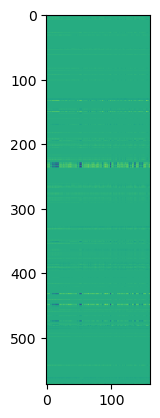

In [18]:
import matplotlib.pyplot as plt
plt.imshow(fimo_summary[0]) #not all motifs obviously, and then of course variant on celltypes!

# actually doing it

In [1]:
import numpy as np
def fimo_ccre_summary(idx, model_type, split, pad_num = 5):
    #this is the function that for a single ccre produces the FIMO summary for every motif in the cCRE
    #this function takes in the index, model type, and the split, from it, it shows how the fimo highest attributions compare
    ccre_summary = np.zeros((572, 161), dtype=np.float32)
    train_df = fimo_results.filter(pl.col('sequence_name') == f'train{idx}')
    # print(train_df.shape) #it's consistent because it's the first one as before! 170 is the number of motifs
    motifs = train_df[['motif_id','start','stop']].to_numpy()
    motifs[:,1] -= extra_pad
    motifs[:,2] += extra_pad
    np.clip(motifs[:,1], 0, 1022, out=motifs[:,1])
    np.clip(motifs[:,2], 0, 1022, out=motifs[:,2])

    #ONLY IF CTST!!!!!
    
    if model_type == 'ctst':
        ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/ctst_bestepoch_{idx}_reg.npy')
        tempism = ism.mean(0)[1:]
    elif model_type == 'multitasking':
        ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/multitasking_25epoch_{idx}_reg.npy')
        tempism = ism.mean(0)
    else:
        raise ValueError('Model type not recognized')

    for i in range(motifs.shape[0]):
        #now we go through and we will find the average value of the ISM for this motif
        start = int(motifs[i,1])
        stop = int(motifs[i,2])
        average_vals = np.mean(tempism[start:stop, :], axis=0) #averages over the whole region keeping each celltype separate!
        #if it's higher than the sum of the current one (in absolute value). will if 0, or if multiple of that motif, chooses biggest one
        if abs(ccre_summary[motif_dict[motifs[i,0]],:]).sum() < abs(average_vals).sum():
            ccre_summary[motif_dict[motifs[i,0]], :] = average_vals
    return ccre_summary
#this is then integrated as fimo_summary[j]

In [2]:
#we need to make our dictionary as well
#let's make this a proper loop and figure out what we're doing
import numpy as np
train_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/train_idx.npy')
val_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/val_idx.npy')
test_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/test_idx.npy')

#remove the 752763 index from train_idx
train_idx = train_idx[train_idx != 752763]
from shap_analysis.ism_utils import ISMUtils
ctst_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-25/15-41-13-286486/checkpoints/last.ckpt'
utils = ISMUtils('DNase_ctst', ctst_path, classification=True, split='train')

import polars as pl
fimo_results = pl.read_csv('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/modisco/fimo_motifs/fimo.tsv', separator = '\t')

fimo_results = fimo_results.drop(['motif_alt_id', 'string'])
fimo_results = fimo_results[:-3]

#this is just the loading of the data

#and now some preprocessing

extra_pad = 5
all_motifs = fimo_results.group_by('motif_id').agg().sort('motif_id')
all_motifs = all_motifs.to_numpy()
motif_dict = {}
counter = 0
for motif in all_motifs:
    motif_dict[motif[0]] = counter
    counter += 1


In [4]:
from tqdm import tqdm
fimo_summary = np.zeros((9999, 572, 161), dtype=np.float32)
fimo_summary_mult = np.zeros((9999, 572, 161), dtype=np.float32)

for j, ccre in tqdm(enumerate(train_idx), total = len(train_idx)):
    fimo_summary[j] = fimo_ccre_summary(ccre, 'ctst', 'train')
    fimo_summary_mult[j] = fimo_ccre_summary(ccre, 'multitasking', 'train')
    
for j, ccre in tqdm(enumerate(val_idx), total = len(val_idx)):
    fimo_summary[j+len(train_idx)] = fimo_ccre_summary(ccre, 'ctst', 'val')
    fimo_summary_mult[j+len(train_idx)] = fimo_ccre_summary(ccre, 'multitasking', 'val')

for j, ccre in tqdm(enumerate(test_idx), total = len(test_idx)):
    fimo_summary[j+len(train_idx)+len(val_idx)] = fimo_ccre_summary(ccre, 'ctst', 'test')
    fimo_summary_mult[j+len(train_idx)+len(val_idx)] = fimo_ccre_summary(ccre, 'multitasking', 'test')

  0%|          | 0/8395 [00:00<?, ?it/s]

100%|██████████| 774/774 [00:52<00:00, 14.82it/s]


In [5]:
#let's just look at one of th emotifs I guess, takes like 15 minutes for both
#for one of the motifs we can look at it based on the dict
print(motif_dict)

{'ALX3_MA0634.1': 0, 'ARNT+HIF1A_MA0259.1': 1, 'ASCL1_MA1100.1': 2, 'ATF4_MA0833.1': 3, 'ATF7_MA0834.1': 4, 'Alx1_MA0854.1': 5, 'Alx4_MA0853.1': 6, 'Ar_MA0007.3': 7, 'Arid3b_MA0601.1': 8, 'Arid5a_MA0602.1': 9, 'Arntl_MA0603.1': 10, 'Arx_MA0874.1': 11, 'Ascl2_MA0816.1': 12, 'Atf1_MA0604.1': 13, 'Atf3_MA0605.1': 14, 'Atoh1_MA0461.2': 15, 'BACH2_MA1101.1': 16, 'BARHL2_MA0635.1': 17, 'BARX1_MA0875.1': 18, 'BATF+JUN_MA0462.1': 19, 'BATF3_MA0835.1': 20, 'BCL6B_MA0731.1': 21, 'BHLHE22_MA0818.1': 22, 'BHLHE23_MA0817.1': 23, 'BHLHE40_MA0464.2': 24, 'BHLHE41_MA0636.1': 25, 'BSX_MA0876.1': 26, 'Bach1+Mafk_MA0591.1': 27, 'Barhl1_MA0877.1': 28, 'Bcl6_MA0463.1': 29, 'Bhlha15_MA0607.1': 30, 'CDX1_MA0878.1': 31, 'CDX2_MA0465.1': 32, 'CEBPA_MA0102.3': 33, 'CEBPB_MA0466.2': 34, 'CEBPD_MA0836.1': 35, 'CEBPE_MA0837.1': 36, 'CEBPG_MA0838.1': 37, 'CENPB_MA0637.1': 38, 'CLOCK_MA0819.1': 39, 'CREB1_MA0018.3': 40, 'CREB3L1_MA0839.1': 41, 'CREB3_MA0638.1': 42, 'CTCFL_MA1102.1': 43, 'CTCF_MA0139.1': 44, 'CUX1_MA

In [8]:
#let's look at ctcf_ma0139.1
print(motif_dict['CTCF_MA0139.1'])

44


<Axes: >

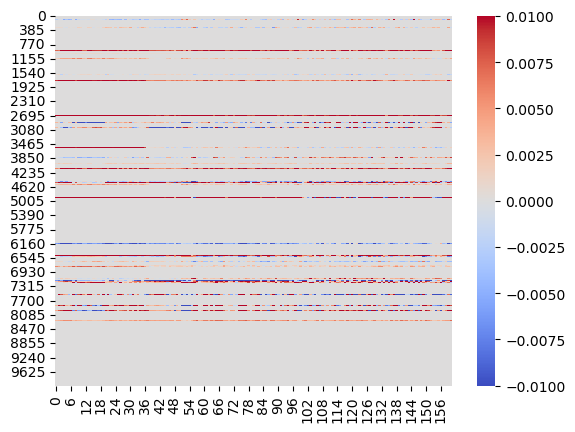

In [12]:
#let's look at 41
import seaborn as sns
sns.heatmap(fimo_summary[:,41,:], cmap='coolwarm', vmax = .01, vmin = -.01)
#we can see that it's only present in a handful of celltypes, and not very high

#ahh so only present in a handful of cres, cann see some faint ones where both negative and postive, some mixed ones in general, but let's look at mult

<Axes: >

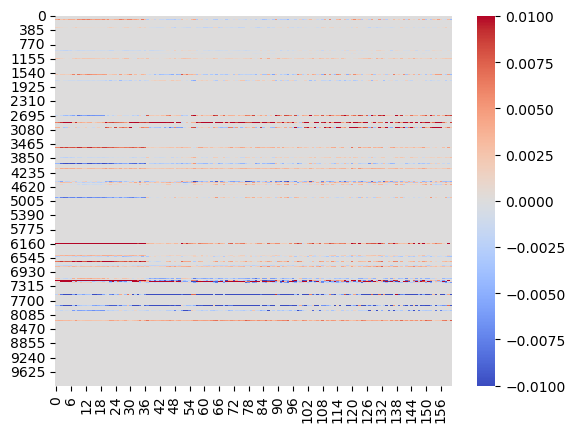

In [13]:
sns.heatmap(fimo_summary_mult[:,41,:], cmap='coolwarm', vmax = .01, vmin = -.01)

#very different celltype attributions!!``

In [14]:
#let's save out the matrices in case
np.savez_compressed('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/modisco/fimo_summary_bothmodel.npz', fimo_summary = fimo_summary, fimo_summary_mult = fimo_summary_mult)

<Axes: >

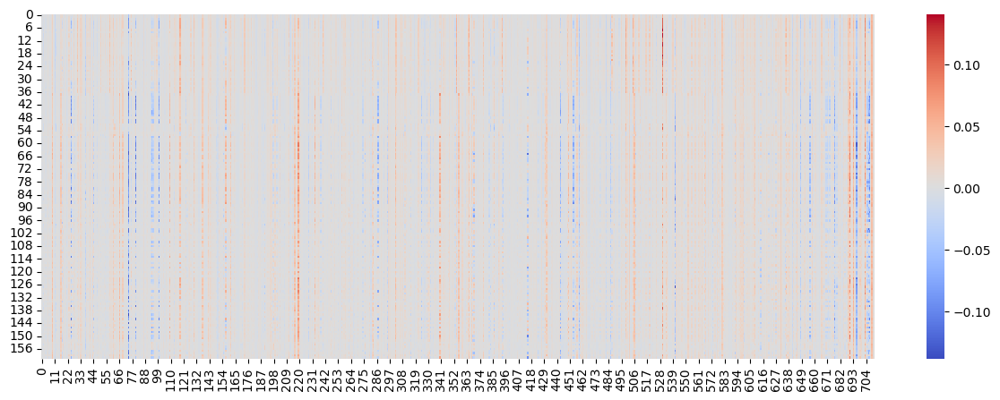

In [27]:
#now let's go ahead and only plot the motifs where there's non zero rows
import matplotlib.pyplot as plt
temp = fimo_summary[:,41,:]
temp = temp[temp.sum(1) != 0]
#and plot again
#make a big figure
fig, ax = plt.subplots(figsize=(15,5))
sns.heatmap(temp.T, cmap='coolwarm', ax = ax)
#pretty small attributions overall

<Axes: >

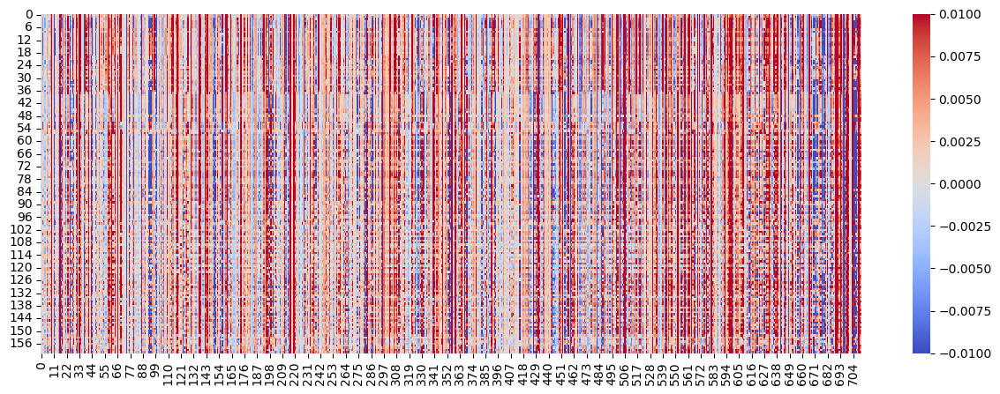

In [20]:
#now let's go ahead and only plot the motifs where there's non zero rows
import matplotlib.pyplot as plt
temp = fimo_summary[:,41,:]
temp = temp[temp.sum(1) != 0]
#and plot again
#make a big figure
fig, ax = plt.subplots(figsize=(15,5))
sns.heatmap(temp.T, cmap='coolwarm', vmax = .01, vmin = -.01, ax = ax)

<Axes: >

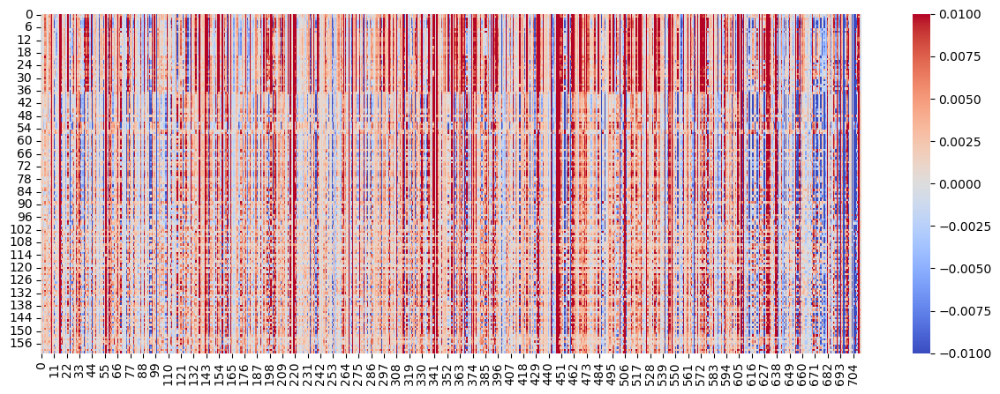

In [21]:
#and now th emultitasking
temp = fimo_summary_mult[:,41,:]
temp = temp[temp.sum(1) != 0]
fig, ax = plt.subplots(figsize=(15,5))
sns.heatmap(temp.T, cmap='coolwarm', vmax = .01, vmin = -.01, ax = ax)

<Axes: >

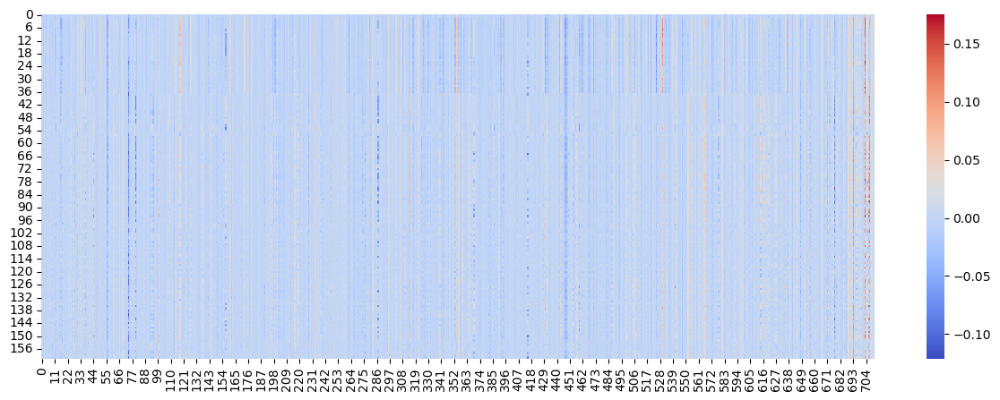

In [23]:
#let's look at the difference
diff = fimo_summary - fimo_summary_mult
temp = diff[:,41,:]
temp = temp[temp.sum(1) != 0]
fig, ax = plt.subplots(figsize=(15,5))
sns.heatmap(temp.T, cmap='coolwarm', ax = ax)

In [ ]:
#so we see higher attributions across the board for the multitasking model, not sure about next steps or how to use this tho.

<Axes: >

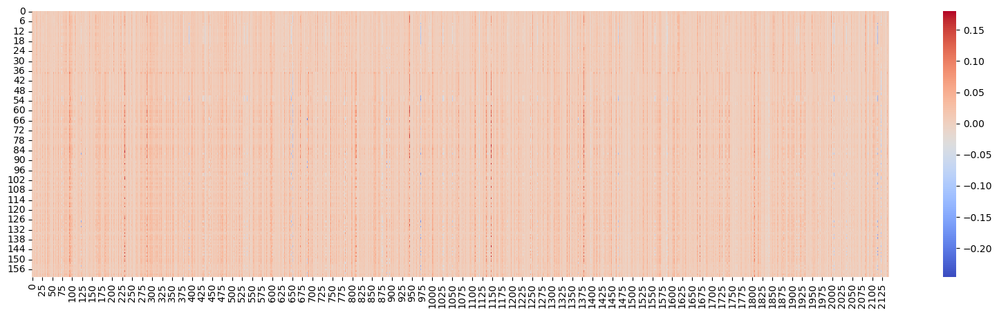

In [26]:
#let's look at 323 now, which is NFKB1
temp = fimo_summary[:,323,:]
#and plot
temp = temp[temp.sum(1) != 0]
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(temp.T,cmap='coolwarm',ax=ax)
#only positive attributions is interesting, and super duper common!

<Axes: >

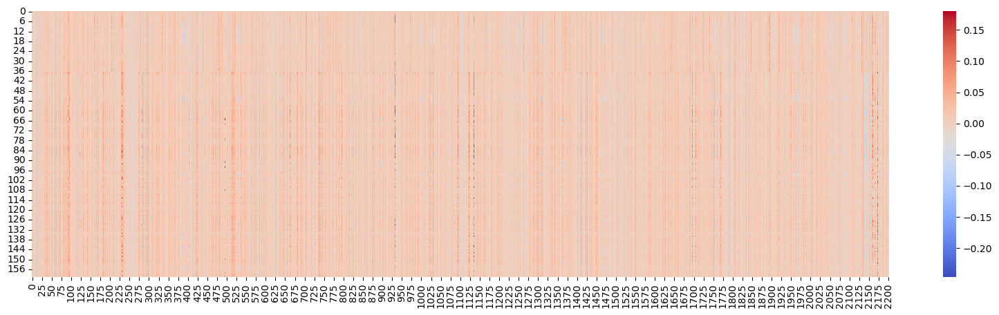

In [28]:
#let's look at 323 now, which is NFKB1
temp = fimo_summary[:,324,:]
#and plot
temp = temp[temp.sum(1) != 0]
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(temp.T,cmap='coolwarm',ax=ax)
#only positive attributions is interesting, and super duper common!

In [24]:
#let's look at th edict keys
dictkeys = list(motif_dict.keys())
#now find an element that contains NFK
nfk = [key for key in dictkeys if 'NFK' in key]

In [25]:
nfk

['NFKB1_MA0105.4', 'NFKB2_MA0778.1']

# looking at interestint CREs 

In [ ]:
#see two that really stand out with NFKB1 where it's a lot of GM cells that ar enegative
#we need to 1) flip it because ew didn't before and 2) look at those 2 CREs

In [1]:
#let's load our saved file
import numpy as np
load = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/modisco/fimo_summary_bothmodel.npz')
fimo_summary,fimo_summary_mult = load['fimo_summary'], load['fimo_summary_mult']
print(fimo_summary.shape, fimo_summary_mult.shape)

(9999, 572, 161) (9999, 572, 161)


In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

<Axes: >

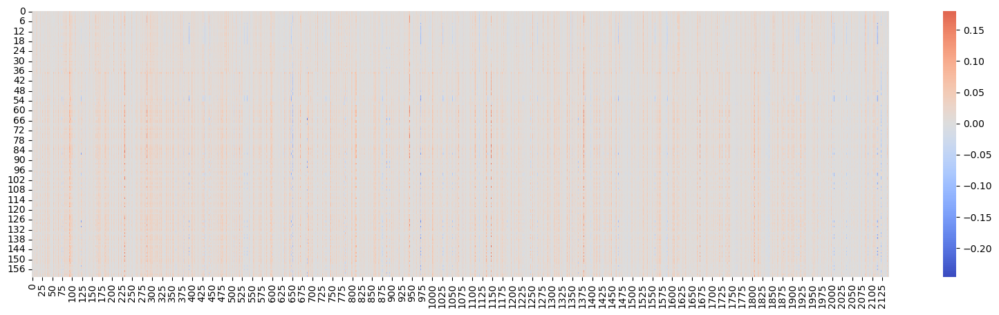

In [6]:

temp = fimo_summary[:,323,:]
#and plot
temp = temp[temp.sum(1) != 0]
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(temp.T,cmap='coolwarm',ax=ax, center=0)

In [12]:
print(temp.shape)
print(temp[2110:].T.shape)

(2143, 161)
(161, 33)


<Axes: >

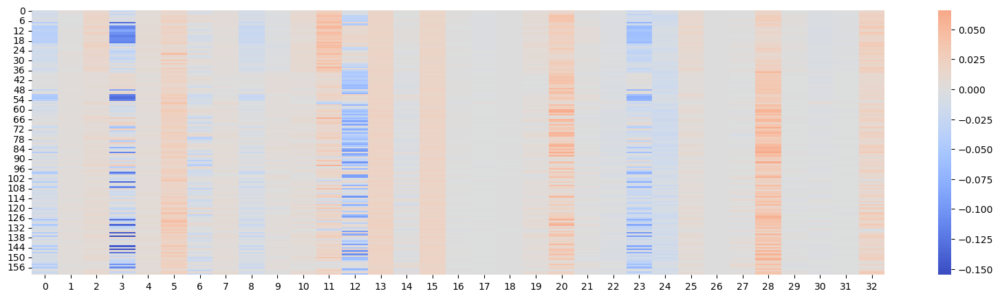

In [14]:
#let's find the exact region, look at 2110 onward
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(temp[2110:].T,cmap='coolwarm',ax=ax, center=0)
#ok, so we see 4 of them that follow this! We see the big one tho is at 2210+3 or 2213a

<Axes: >

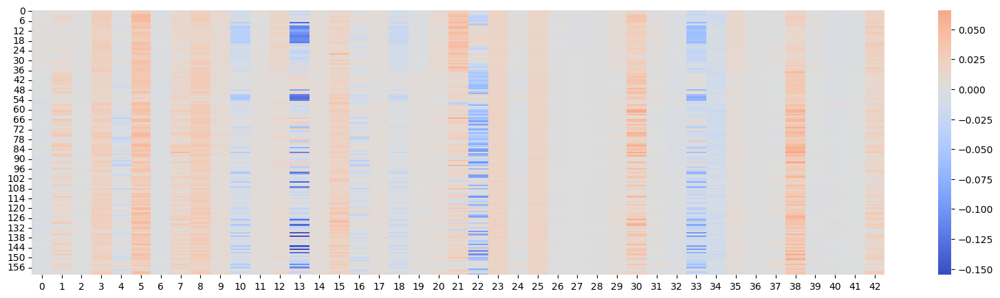

In [15]:
#let's find the exact region, look at 2110 onward
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(temp[2100:].T,cmap='coolwarm',ax=ax, center=0)
#ok, so we see 4 of them that follow this! We see the big one tho is at 2110+3 or 2113

In [16]:
#let's take a look at the heatmap corresponding to cCRE 2113, which is actually one from the mask, find the 2113th element of the mask
temp = fimo_summary[:,323,:]
mask = temp.sum(1) != 0
print(mask.shape)

(9999,)


In [17]:
#find the 2113th non 0
mask = temp.sum(1) != 0
mask = np.where(mask)[0]
print(mask.shape)

(2143,)


In [18]:
mask[2113] #it's cCRE 8257 which is... still in the train set, cCRE 8257 in the list, but i don't know whihc order it goes in...

8257

In [19]:
#it is based on elements of train_idx, so to figure it out, load in train idx
train_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/train_idx.npy')
train_idx = train_idx[train_idx != 752763]
#now look for train_idx[8257]
print(train_idx[8257])

757673


In [20]:
#let's look for this result from the ism results
#we want cCRE 757673 and looking for NFKB1
#first load in the ism results
split = 'train'
filename = 'ctst_bestepoch'
filename_mult = 'multitasking_25epoch'
idx = 757673
ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename}_{idx}_reg.npy')
ism_mult = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename_mult}_{idx}_reg.npy')

In [25]:
#now let's plot it
from shap_analysis.ism_utils import *
multitasking_path1 = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-27/18-39-11-031863/checkpoints/25-val_loss=0.52186.ckpt' #the 25 epoch one
ctst_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-25/15-41-13-286486/checkpoints/last.ckpt'
mult = ISMUtils('DNase_allcelltypes', multitasking_path1, classification=True)
ctst = ISMUtils('DNase_ctst', ctst_path, classification=True)

In [26]:
true_values = mult.dataset[idx][1][1] #the first 1 is results, then the second 1 is regression
print(true_values.shape)

torch.Size([161])


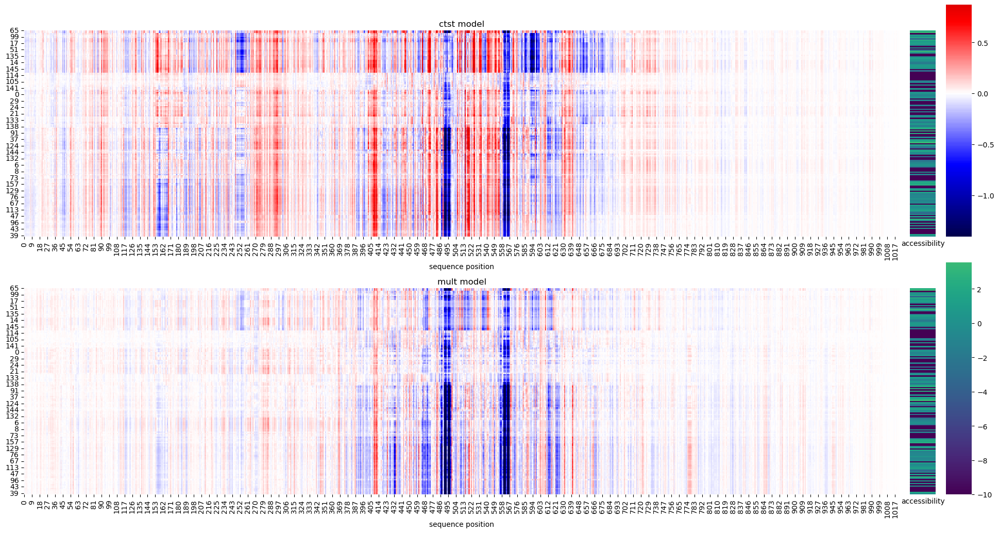

In [27]:
multi_cluster([ism,ism_mult], true_values, ['ctst', 'mult'], utils_list = [ctst,mult])

In [30]:
#now have to load in the datafram to see where it is!
import numpy as np
def fimo_ccre_summary(idx, model_type, split, pad_num = 5):
    #this is the function that for a single ccre produces the FIMO summary for every motif in the cCRE
    #this function takes in the index, model type, and the split, from it, it shows how the fimo highest attributions compare
    ccre_summary = np.zeros((572, 161), dtype=np.float32)
    train_df = fimo_results.filter(pl.col('sequence_name') == f'train{idx}')
    # print(train_df.shape) #it's consistent because it's the first one as before! 170 is the number of motifs
    motifs = train_df[['motif_id','start','stop']].to_numpy()
    motifs[:,1] -= extra_pad
    motifs[:,2] += extra_pad
    np.clip(motifs[:,1], 0, 1022, out=motifs[:,1])
    np.clip(motifs[:,2], 0, 1022, out=motifs[:,2])

    #ONLY IF CTST!!!!!
    
    if model_type == 'ctst':
        ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/ctst_bestepoch_{idx}_reg.npy')
        tempism = ism.mean(0)[1:]
    elif model_type == 'multitasking':
        ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/multitasking_25epoch_{idx}_reg.npy')
        tempism = ism.mean(0)
    else:
        raise ValueError('Model type not recognized')

    for i in range(motifs.shape[0]):
        #now we go through and we will find the average value of the ISM for this motif
        start = int(motifs[i,1])
        stop = int(motifs[i,2])
        average_vals = np.mean(tempism[start:stop, :], axis=0) #averages over the whole region keeping each celltype separate!
        #if it's higher than the sum of the current one (in absolute value). will if 0, or if multiple of that motif, chooses biggest one
        if abs(ccre_summary[motif_dict[motifs[i,0]],:]).sum() < abs(average_vals).sum():
            ccre_summary[motif_dict[motifs[i,0]], :] = average_vals
    return ccre_summary
#this is then integrated as fimo_summary[j]
#we need to make our dictionary as well
#let's make this a proper loop and figure out what we're doing
import numpy as np
train_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/train_idx.npy')
val_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/val_idx.npy')
test_idx = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/test_idx.npy')

#remove the 752763 index from train_idx
train_idx = train_idx[train_idx != 752763]
from shap_analysis.ism_utils import ISMUtils
ctst_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-25/15-41-13-286486/checkpoints/last.ckpt'
utils = ISMUtils('DNase_ctst', ctst_path, classification=True, split='train')

import polars as pl
fimo_results = pl.read_csv('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/modisco/fimo_motifs/fimo.tsv', separator = '\t')

fimo_results = fimo_results.drop(['motif_alt_id', 'string'])
fimo_results = fimo_results[:-3]

#this is just the loading of the data

#and now some preprocessing

extra_pad = 5
all_motifs = fimo_results.group_by('motif_id').agg().sort('motif_id')
all_motifs = all_motifs.to_numpy()
motif_dict = {}
counter = 0
for motif in all_motifs:
    motif_dict[motif[0]] = counter
    counter += 1

In [31]:
train_df = fimo_results.filter(pl.col('sequence_name') == f'train{idx}')
train_df.head()

motif_id,sequence_name,start,stop,strand,score,p-value,q-value,matched_sequence
str,str,i64,i64,str,f64,f64,f64,str
"""IRF1_MA0050.2""","""train757673""",243,263,"""-""",20.871,4.4000e-8,0.0225,"""TTTTACTTTCACTT…"
"""IRF1_MA0050.2""","""train757673""",249,269,"""-""",17.871,5.9500e-7,0.033,"""TGGAAGTTTTACTT…"
"""BATF+JUN_MA046…","""train757673""",492,502,"""-""",16.5,6.0800e-7,0.295,"""GAAATGAGTCA"""
"""Foxa2_MA0047.2…","""train757673""",825,836,"""+""",15.88,0.000002,0.268,"""TGTTTACATTGT"""
"""IRF2_MA0051.1""","""train757673""",247,264,"""+""",14.5963,0.000002,0.413,"""CCAAAGTGAAAGTA…"


In [32]:
motifs = train_df[['motif_id','start','stop']].to_numpy()
motifs[:,1] -= extra_pad
motifs[:,2] += extra_pad
np.clip(motifs[:,1], 0, 1022, out=motifs[:,1])
np.clip(motifs[:,2], 0, 1022, out=motifs[:,2])
motifs

array([['IRF1_MA0050.2', 238, 268],
       ['IRF1_MA0050.2', 244, 274],
       ['BATF+JUN_MA0462.1', 487, 507],
       ['Foxa2_MA0047.2', 820, 841],
       ['IRF2_MA0051.1', 242, 269],
       ['FOS_MA0476.1', 485, 505],
       ['FOXH1_MA0479.1', 704, 724],
       ['BATF+JUN_MA0462.1', 556, 576],
       ['FOSL1+JUND_MA1142.1', 555, 574],
       ['IRF7_MA0772.1', 241, 264],
       ['FOSL2+JUN_MA1130.1', 553, 574],
       ['JDP2_MA0655.1', 555, 573],
       ['FOSL1+JUNB_MA1137.1', 553, 575],
       ['POU5F1_MA1115.1', 646, 666],
       ['NFKB2_MA0778.1', 586, 608],
       ['JUN+JUNB_MA1132.1', 555, 574],
       ['FOS+JUN_MA0099.3', 485, 504],
       ['NFKB2_MA0778.1', 586, 608],
       ['PRDM1_MA0508.2', 247, 266],
       ['FOXA1_MA0148.3', 816, 840],
       ['FOSL2+JUNB_MA1138.1', 485, 504],
       ['FOSL1+JUN_MA1128.1', 553, 575],
       ['JUND_MA0491.1', 485, 505],
       ['FOS+JUN_MA0099.3', 555, 574],
       ['FOS+JUND_MA1141.1', 553, 575],
       ['POU2F2_MA0507.1', 644, 666],
     

In [33]:
#find all motifs[:,0] that are NFKB1_MA0105.4
nfk = motifs[motifs[:,0] == 'NFKB1_MA0105.4']
print(nfk)

[['NFKB1_MA0105.4' 586 608]
 ['NFKB1_MA0105.4' 586 608]]


2

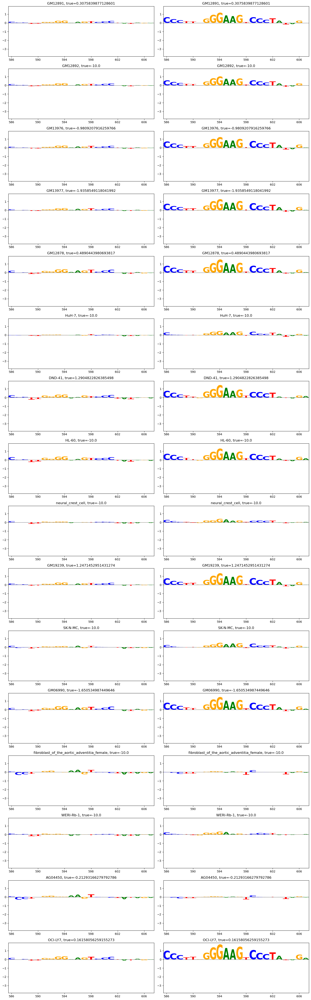

In [40]:
#it's 586 to 608
start = 586
end = 608
cell_idxs = [11, 12, 13, 14, 54, 24, 156, 154, 153, 17, 95, 51, 43, 114, 39, 137]
celltype_compare_logo([mult,ctst],idx, cell_idxs, [ism_mult.sum(0), ism.sum(0)], startend=(start,end), true_values = true_values)
2

In [55]:
#very intresting results, almost all the positive ones seem to be some kind of B cell, and this is not found in the multitaksing model at all!
#evenOCI-LY7 is a B cell lymphoma cell line!
#now let's see which cell types perform poorly, if it's some of the B cells, well we have an idea!
#we can also look at som eo fthe other ones like this, lots of these similar patterns from the FIMO, especially for this which is cell type specific! 
#key idea is if not important for this CRE specifically, still considered important for this subset of celltypes, worth discussing and looking into
#one of them is 20 higher, have to convert it to find the right idx
print(mask[2113+20])
print(train_idx[8370])

8370
616845


In [56]:
#let's first look at some of the other examples like this
idx = 616845
ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename}_{idx}_reg.npy')
ism_mult = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename_mult}_{idx}_reg.npy')

In [62]:
filename

'ctst_bestepoch'

In [57]:
true_values = mult.dataset[idx][1][1]

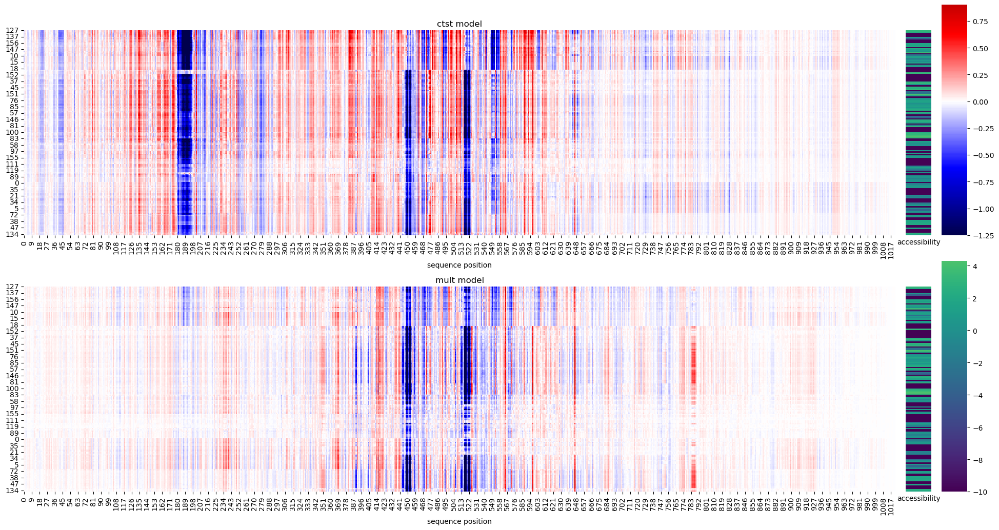

In [58]:
multi_cluster([ism,ism_mult], true_values, ['ctst', 'mult'], utils_list = [ctst,mult])
#on this example multitasking appears more cel type specific, but hard to tell what is actually meaningful!

In [59]:
#and of course find the start and stop regions, use the same cells tho for reference
train_df = fimo_results.filter(pl.col('sequence_name') == f'train{idx}')
train_df.head()
motifs = train_df[['motif_id','start','stop']].to_numpy()
motifs[:,1] -= extra_pad
motifs[:,2] += extra_pad
np.clip(motifs[:,1], 0, 1022, out=motifs[:,1])
np.clip(motifs[:,2], 0, 1022, out=motifs[:,2])
#find all motifs[:,0] that are NFKB1_MA0105.4
nfk = motifs[motifs[:,0] == 'NFKB1_MA0105.4']
# print(motifs)
print(nfk) #wait why is this empty?

[['NFKB1_MA0105.4' 542 564]
 ['NFKB1_MA0105.4' 542 564]
 ['NFKB1_MA0105.4' 529 551]
 ['NFKB1_MA0105.4' 529 551]]


(<Figure size 1500x4800 with 32 Axes>,
 array([[<Axes: title={'center': 'GM12891, true=0.8475494384765625'}>,
         <Axes: title={'center': 'GM12891, true=0.8475494384765625'}>],
        [<Axes: title={'center': 'GM12892, true=-10.0'}>,
         <Axes: title={'center': 'GM12892, true=-10.0'}>],
        [<Axes: title={'center': 'GM13976, true=-0.2501136064529419'}>,
         <Axes: title={'center': 'GM13976, true=-0.2501136064529419'}>],
        [<Axes: title={'center': 'GM13977, true=-2.9277870655059814'}>,
         <Axes: title={'center': 'GM13977, true=-2.9277870655059814'}>],
        [<Axes: title={'center': 'GM12878, true=-10.0'}>,
         <Axes: title={'center': 'GM12878, true=-10.0'}>],
        [<Axes: title={'center': 'HuH-7, true=-10.0'}>,
         <Axes: title={'center': 'HuH-7, true=-10.0'}>],
        [<Axes: title={'center': 'DND-41, true=1.8310644626617432'}>,
         <Axes: title={'center': 'DND-41, true=1.8310644626617432'}>],
        [<Axes: title={'center': 'HL-60,

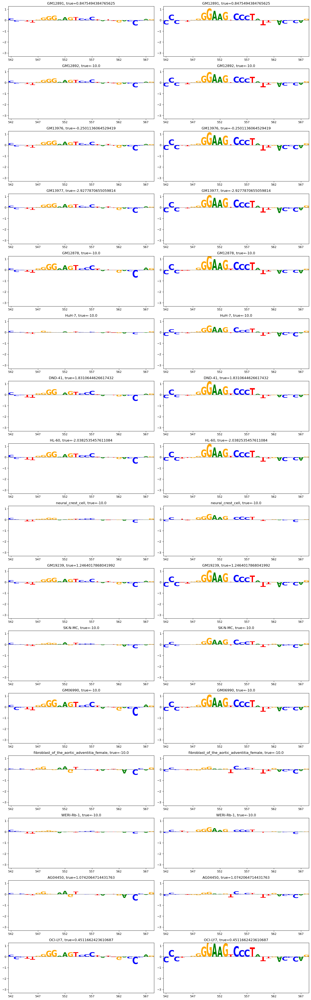

In [60]:
#hmmm, 2 of them, let's look at both
start = 542
end = 569
celltype_compare_logo([mult,ctst],idx, cell_idxs, [ism_mult.sum(0), ism.sum(0)], startend=(start,end), true_values = true_values)

(<Figure size 1500x4800 with 32 Axes>,
 array([[<Axes: title={'center': 'GM12891, true=0.8475494384765625'}>,
         <Axes: title={'center': 'GM12891, true=0.8475494384765625'}>],
        [<Axes: title={'center': 'GM12892, true=-10.0'}>,
         <Axes: title={'center': 'GM12892, true=-10.0'}>],
        [<Axes: title={'center': 'GM13976, true=-0.2501136064529419'}>,
         <Axes: title={'center': 'GM13976, true=-0.2501136064529419'}>],
        [<Axes: title={'center': 'GM13977, true=-2.9277870655059814'}>,
         <Axes: title={'center': 'GM13977, true=-2.9277870655059814'}>],
        [<Axes: title={'center': 'GM12878, true=-10.0'}>,
         <Axes: title={'center': 'GM12878, true=-10.0'}>],
        [<Axes: title={'center': 'HuH-7, true=-10.0'}>,
         <Axes: title={'center': 'HuH-7, true=-10.0'}>],
        [<Axes: title={'center': 'DND-41, true=1.8310644626617432'}>,
         <Axes: title={'center': 'DND-41, true=1.8310644626617432'}>],
        [<Axes: title={'center': 'HL-60,

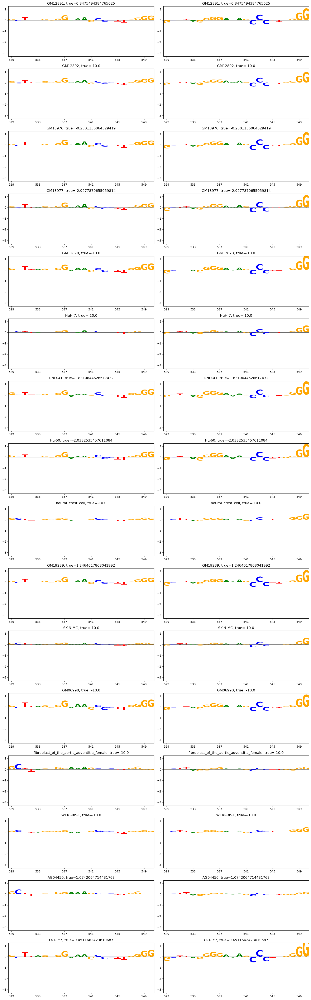

In [61]:
start,end = 529,551
celltype_compare_logo([mult,ctst],idx, cell_idxs, [ism_mult.sum(0), ism.sum(0)], startend=(start,end), true_values = true_values)
#this one is terrible, definitely don't look at this one!

<Axes: >

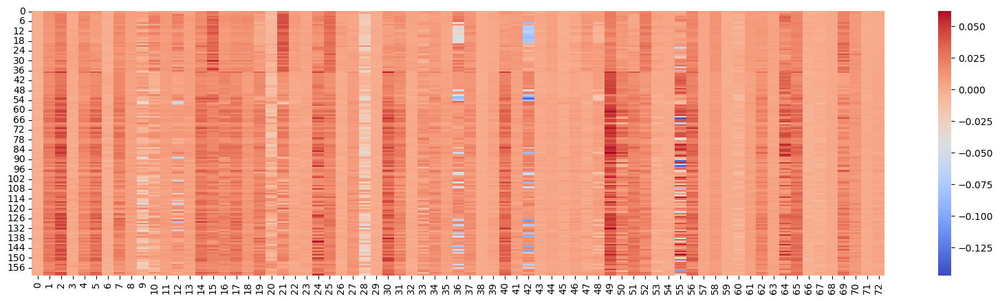

In [64]:
#ok this one is similar, but multitasking model also picks up, just smaller attributions overall?
#skn is some sort of brain tumor, so that's an issue for sure, shouldn't be high
#let's look back at the original fimo plot
#let's look at 323 now, which is NFKB1
temp = fimo_summary[:,323,:]
#and plot
temp = temp[temp.sum(1) != 0]
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(temp[350:423].T,cmap='coolwarm',ax=ax)
#only positive attributions is interesting, and super duper common!

In [66]:
#so it's 350+42
print(mask[350+42])
print(train_idx[1921])

1921
482617


[['NFKB1_MA0105.4' 569 591]
 ['NFKB1_MA0105.4' 569 591]
 ['NFKB1_MA0105.4' 495 517]
 ['NFKB1_MA0105.4' 494 516]
 ['NFKB1_MA0105.4' 495 517]
 ['NFKB1_MA0105.4' 494 516]]


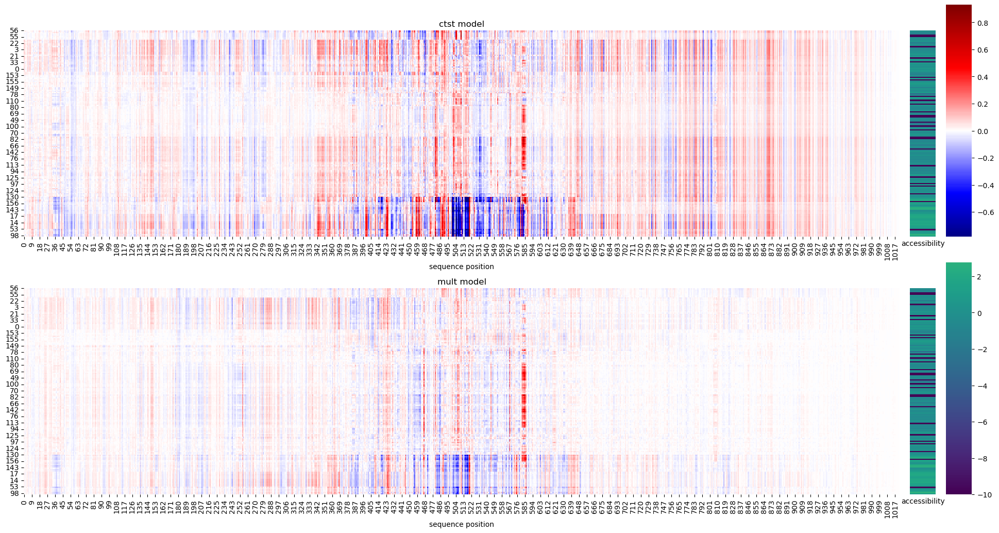

In [67]:
idx = 482617
ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename}_{idx}_reg.npy')
ism_mult = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename_mult}_{idx}_reg.npy')
true_values = mult.dataset[idx][1][1]
multi_cluster([ism,ism_mult], true_values, ['ctst', 'mult'], utils_list = [ctst,mult])
#on this example multitasking appears more cel type specific, but hard to tell what is actually meaningful!
#and of course find the start and stop regions, use the same cells tho for reference
train_df = fimo_results.filter(pl.col('sequence_name') == f'train{idx}')
train_df.head()
motifs = train_df[['motif_id','start','stop']].to_numpy()
motifs[:,1] -= extra_pad
motifs[:,2] += extra_pad
np.clip(motifs[:,1], 0, 1022, out=motifs[:,1])
np.clip(motifs[:,2], 0, 1022, out=motifs[:,2])
#find all motifs[:,0] that are NFKB1_MA0105.4
nfk = motifs[motifs[:,0] == 'NFKB1_MA0105.4']
# print(motifs)
print(nfk) #wait why is this empty?

(<Figure size 1500x4800 with 32 Axes>,
 array([[<Axes: title={'center': 'GM12891, true=1.6665514707565308'}>,
         <Axes: title={'center': 'GM12891, true=1.6665514707565308'}>],
        [<Axes: title={'center': 'GM12892, true=1.7625174522399902'}>,
         <Axes: title={'center': 'GM12892, true=1.7625174522399902'}>],
        [<Axes: title={'center': 'GM13976, true=0.6312668919563293'}>,
         <Axes: title={'center': 'GM13976, true=0.6312668919563293'}>],
        [<Axes: title={'center': 'GM13977, true=1.6752947568893433'}>,
         <Axes: title={'center': 'GM13977, true=1.6752947568893433'}>],
        [<Axes: title={'center': 'GM12878, true=2.582904577255249'}>,
         <Axes: title={'center': 'GM12878, true=2.582904577255249'}>],
        [<Axes: title={'center': 'HuH-7, true=-10.0'}>,
         <Axes: title={'center': 'HuH-7, true=-10.0'}>],
        [<Axes: title={'center': 'DND-41, true=1.2632293701171875'}>,
         <Axes: title={'center': 'DND-41, true=1.2632293701171875

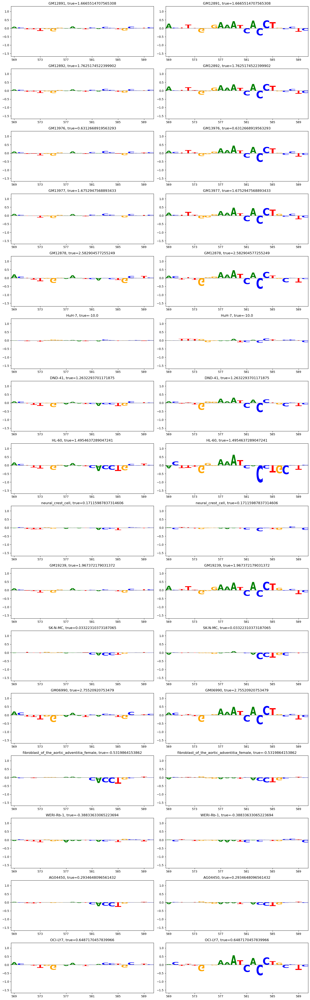

In [68]:
#let's look 569 to 591
start = 569
end = 591
celltype_compare_logo([mult,ctst],idx, cell_idxs, [ism_mult.sum(0), ism.sum(0)], startend=(start,end), true_values = true_values)

(<Figure size 1500x4800 with 32 Axes>,
 array([[<Axes: title={'center': 'GM12891, true=1.6665514707565308'}>,
         <Axes: title={'center': 'GM12891, true=1.6665514707565308'}>],
        [<Axes: title={'center': 'GM12892, true=1.7625174522399902'}>,
         <Axes: title={'center': 'GM12892, true=1.7625174522399902'}>],
        [<Axes: title={'center': 'GM13976, true=0.6312668919563293'}>,
         <Axes: title={'center': 'GM13976, true=0.6312668919563293'}>],
        [<Axes: title={'center': 'GM13977, true=1.6752947568893433'}>,
         <Axes: title={'center': 'GM13977, true=1.6752947568893433'}>],
        [<Axes: title={'center': 'GM12878, true=2.582904577255249'}>,
         <Axes: title={'center': 'GM12878, true=2.582904577255249'}>],
        [<Axes: title={'center': 'HuH-7, true=-10.0'}>,
         <Axes: title={'center': 'HuH-7, true=-10.0'}>],
        [<Axes: title={'center': 'DND-41, true=1.2632293701171875'}>,
         <Axes: title={'center': 'DND-41, true=1.2632293701171875

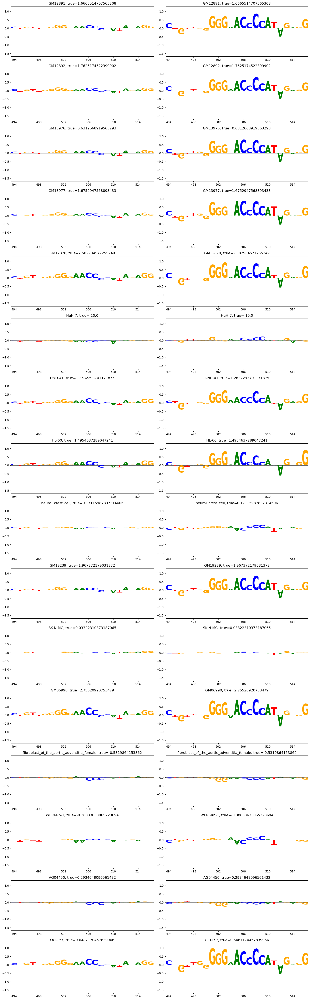

In [69]:
#let's look 569 to 591
start = 494
end = 517
celltype_compare_logo([mult,ctst],idx, cell_idxs, [ism_mult.sum(0), ism.sum(0)], startend=(start,end), true_values = true_values)

In [72]:
#this example is phenomenal! Shows that CTST model learns this so much better!!
#actually good that AG i s accessible but this motif isn't the important one! Great to see
#it's because different TF binding motifs might be the cause for it being accessible, or sometimes not full CRE exposed, just the motif
#spi1, pax5, fox01, foxb1, pow2f2 and pow2f1 are all b cell ones
#gata is important for blood like k562 cells
#look at some fibroblast ones as well!
#let's look for gata
dict_list = list(motif_dict.keys())

In [73]:
#now try to find GATA in dict_list
for i in dict_list:
    if 'gata' in i.lower():
        print(i)

GATA1+TAL1_MA0140.2
GATA2_MA0036.3
GATA3_MA0037.3
GATA5_MA0766.1
GATA6_MA1104.1
Gata1_MA0035.3
Gata4_MA0482.1


In [74]:
#ok there's a lot of GATA motifs, Gata1-3 are apparently important, let's look for any consistent patterns in GATA
motif_dict['GATA2_MA0036.3']

156

<Axes: >

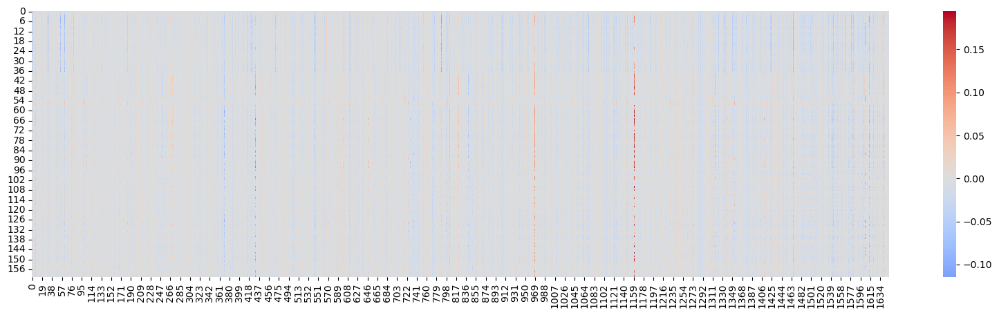

In [76]:
#so it's 156, let's check that from fimo dict
temp = fimo_summary[:,156,:]
#and plot
temp = temp[temp.sum(1) != 0]
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(-temp.T,cmap='coolwarm',ax=ax, center=0)

<Axes: >

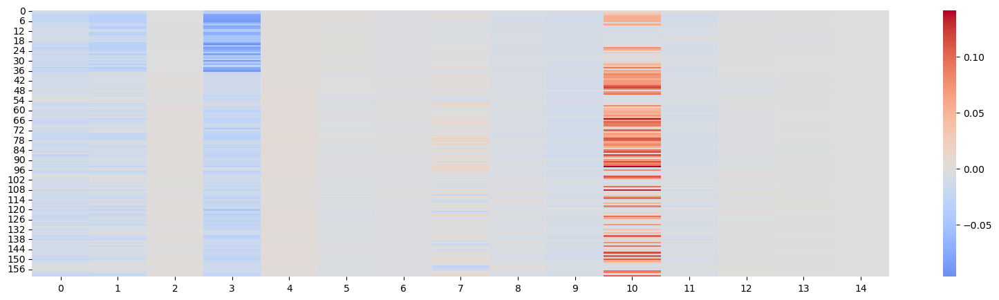

In [77]:
#see 3 of these red lines, of course we did flip it here!
#let's look at those CREs
temp = fimo_summary[:,156,:]
temp = temp[temp.sum(1) != 0]
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(-temp[420:435].T,cmap='coolwarm',ax=ax, center=0)
#again see this pattern in the blue and the red
#red is explored below, blue is explored in fIMO_global2.ipynb
#wait negative is repressive, not too useful

In [84]:
temp[430].min() #uhh, this is right...

-0.14111328

In [87]:
#it's 430
#oh we need to redefine mask
temp = fimo_summary[:,156,:]
mask = temp.sum(1) != 0
mask = np.where(mask)[0]
print(a:=mask[430])
print(train_idx[a])

2144
84729


[['GATA2_MA0036.3' 495 515]]


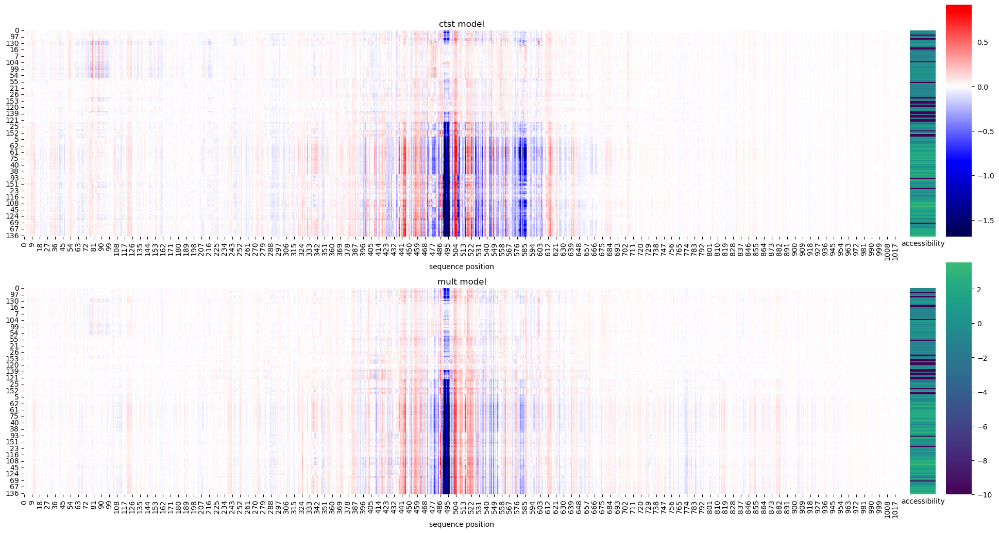

In [88]:
idx = 84729
ism = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename}_{idx}_reg.npy')
ism_mult = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/most_variable_cCREs2/{split}/{filename_mult}_{idx}_reg.npy')
true_values = mult.dataset[idx][1][1]
multi_cluster([ism,ism_mult], true_values, ['ctst', 'mult'], utils_list = [ctst,mult])
#on this example multitasking appears more cel type specific, but hard to tell what is actually meaningful!
#and of course find the start and stop regions, use the same cells tho for reference
train_df = fimo_results.filter(pl.col('sequence_name') == f'train{idx}')
train_df.head()
motifs = train_df[['motif_id','start','stop']].to_numpy()
motifs[:,1] -= extra_pad
motifs[:,2] += extra_pad
np.clip(motifs[:,1], 0, 1022, out=motifs[:,1])
np.clip(motifs[:,2], 0, 1022, out=motifs[:,2])
#find all motifs[:,0] that are NFKB1_MA0105.4
nfk = motifs[motifs[:,0] == 'GATA2_MA0036.3']
# print(motifs)
print(nfk) #wait why is this empty?

(<Figure size 1500x4800 with 32 Axes>,
 array([[<Axes: title={'center': 'GM12891, true=-2.0933148860931396'}>,
         <Axes: title={'center': 'GM12891, true=-2.0933148860931396'}>],
        [<Axes: title={'center': 'GM12892, true=-10.0'}>,
         <Axes: title={'center': 'GM12892, true=-10.0'}>],
        [<Axes: title={'center': 'GM13976, true=-0.9118748903274536'}>,
         <Axes: title={'center': 'GM13976, true=-0.9118748903274536'}>],
        [<Axes: title={'center': 'GM13977, true=-0.9975324869155884'}>,
         <Axes: title={'center': 'GM13977, true=-0.9975324869155884'}>],
        [<Axes: title={'center': 'GM12878, true=-0.011206801049411297'}>,
         <Axes: title={'center': 'GM12878, true=-0.011206801049411297'}>],
        [<Axes: title={'center': 'HuH-7, true=-0.5881271958351135'}>,
         <Axes: title={'center': 'HuH-7, true=-0.5881271958351135'}>],
        [<Axes: title={'center': 'DND-41, true=-10.0'}>,
         <Axes: title={'center': 'DND-41, true=-10.0'}>],
    

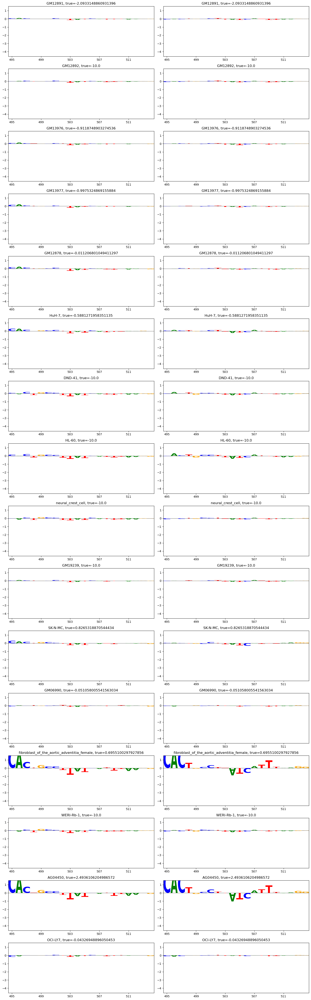

In [89]:
#and it's 495 to 515
start = 495
end = 515
celltype_compare_logo([mult,ctst],idx, cell_idxs, [ism_mult.sum(0), ism.sum(0)], startend=(start,end), true_values = true_values)

In [91]:
ctst.find_ccre_type(idx) #ok so what is that huge peak? this is maybe worth exploringn, not seen in B cells, only the 

'dELS'

In [94]:
#huh, let's look into this, this is cool cuz AG is a fibroblast
#let's see which motifs are within this region, 486
filtered_df = fimo_results.filter(fimo_results['sequence_name'] == f'train{idx}')
print(a := filtered_df.filter(filtered_df['start'].is_in(list(range(486,492)))))

shape: (35, 9)
┌───────────────┬───────────────┬───────┬──────┬───┬─────────┬───────────┬─────────┬───────────────┐
│ motif_id      ┆ sequence_name ┆ start ┆ stop ┆ … ┆ score   ┆ p-value   ┆ q-value ┆ matched_seque │
│ ---           ┆ ---           ┆ ---   ┆ ---  ┆   ┆ ---     ┆ ---       ┆ ---     ┆ nce           │
│ str           ┆ str           ┆ i64   ┆ i64  ┆   ┆ f64     ┆ f64       ┆ f64     ┆ ---           │
│               ┆               ┆       ┆      ┆   ┆         ┆           ┆         ┆ str           │
╞═══════════════╪═══════════════╪═══════╪══════╪═══╪═════════╪═══════════╪═════════╪═══════════════╡
│ JUN_MA0489.1  ┆ train84729    ┆ 490   ┆ 503  ┆ … ┆ 15.4615 ┆ 0.000003  ┆ 0.328   ┆ AGGCAGTGAGTCA │
│               ┆               ┆       ┆      ┆   ┆         ┆           ┆         ┆ T             │
│ FOSL1+JUN_MA1 ┆ train84729    ┆ 488   ┆ 500  ┆ … ┆ 14.2333 ┆ 0.000009  ┆ 0.484   ┆ CTATGACTCACTG │
│ 128.1         ┆               ┆       ┆      ┆   ┆         ┆           ┆  

In [98]:
np.unique(a.to_numpy()[:,0])
#BATF and JUN are ones commonly seen in fibroblasts, still play a role in B cells but less so, likely unique? need to verify


array(['BATF+JUN_MA0462.1', 'FOS+JUNB_MA1134.1', 'FOS+JUND_MA1141.1',
       'FOS+JUN_MA0099.3', 'FOSB+JUNB_MA1135.1', 'FOSL1+JUNB_MA1137.1',
       'FOSL1+JUND_MA1142.1', 'FOSL1+JUN_MA1128.1', 'FOSL1_MA0477.1',
       'FOSL2+JUNB_MA1138.1', 'FOSL2+JUND_MA1144.1', 'FOSL2+JUN_MA1130.1',
       'FOSL2_MA0478.1', 'FOS_MA0476.1', 'JDP2_MA0655.1',
       'JUN+JUNB_MA1132.1', 'JUNB_MA0490.1', 'JUND_MA0491.1',
       'JUN_MA0489.1', 'NFE2_MA0841.1'], dtype=object)

(<Figure size 1500x4800 with 32 Axes>,
 array([[<Axes: title={'center': 'GM12891, true=-2.0933148860931396'}>,
         <Axes: title={'center': 'GM12891, true=-2.0933148860931396'}>],
        [<Axes: title={'center': 'GM12892, true=-10.0'}>,
         <Axes: title={'center': 'GM12892, true=-10.0'}>],
        [<Axes: title={'center': 'GM13976, true=-0.9118748903274536'}>,
         <Axes: title={'center': 'GM13976, true=-0.9118748903274536'}>],
        [<Axes: title={'center': 'GM13977, true=-0.9975324869155884'}>,
         <Axes: title={'center': 'GM13977, true=-0.9975324869155884'}>],
        [<Axes: title={'center': 'GM12878, true=-0.011206801049411297'}>,
         <Axes: title={'center': 'GM12878, true=-0.011206801049411297'}>],
        [<Axes: title={'center': 'HuH-7, true=-0.5881271958351135'}>,
         <Axes: title={'center': 'HuH-7, true=-0.5881271958351135'}>],
        [<Axes: title={'center': 'DND-41, true=-10.0'}>,
         <Axes: title={'center': 'DND-41, true=-10.0'}>],
    

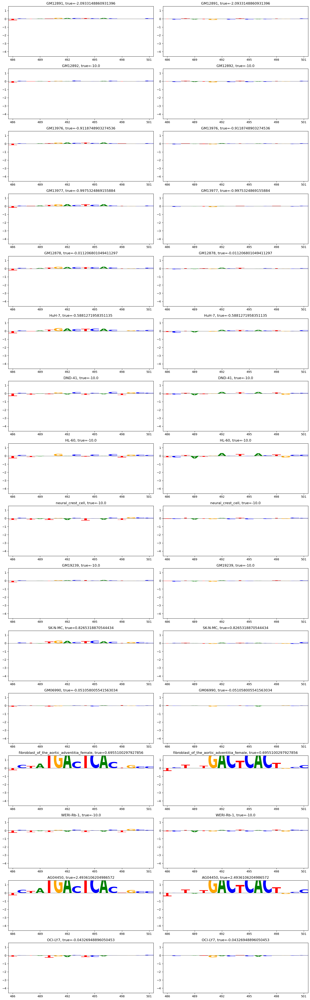

In [101]:
#and it's 495 to 515
start = 486
end = 502
celltype_compare_logo([mult,ctst],idx, cell_idxs, [ism_mult.sum(0), ism.sum(0)], startend=(start,end), true_values = true_values)

In [103]:
ism_mult.sum(0).shape

(1023, 161)

In [104]:
ism.sum(0).shape

(1024, 161)

(<Figure size 1500x5700 with 38 Axes>,
 array([[<Axes: title={'center': 'GM12891, true=-2.0933148860931396'}>,
         <Axes: title={'center': 'GM12891, true=-2.0933148860931396'}>],
        [<Axes: title={'center': 'GM12892, true=-10.0'}>,
         <Axes: title={'center': 'GM12892, true=-10.0'}>],
        [<Axes: title={'center': 'GM13976, true=-0.9118748903274536'}>,
         <Axes: title={'center': 'GM13976, true=-0.9118748903274536'}>],
        [<Axes: title={'center': 'GM13977, true=-0.9975324869155884'}>,
         <Axes: title={'center': 'GM13977, true=-0.9975324869155884'}>],
        [<Axes: title={'center': 'GM12878, true=-0.011206801049411297'}>,
         <Axes: title={'center': 'GM12878, true=-0.011206801049411297'}>],
        [<Axes: title={'center': 'HuH-7, true=-0.5881271958351135'}>,
         <Axes: title={'center': 'HuH-7, true=-0.5881271958351135'}>],
        [<Axes: title={'center': 'DND-41, true=-10.0'}>,
         <Axes: title={'center': 'DND-41, true=-10.0'}>],
    

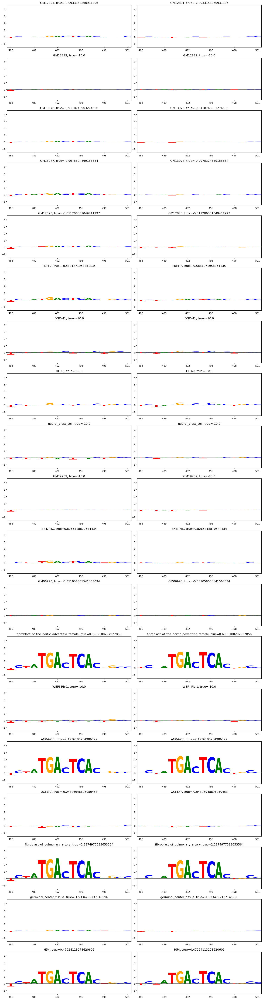

In [110]:
#so it shows that the models leanr somethign and it's quite similar! But it's also clear that we have an obvious bug...
#the way we index into the ctst it treats it like it's 1023...
def celltype_compare_logo(utils_list, ccre, celltype_idx, heights_all_list, startend=None, true_values = None):
    # utils is the list of utilities in order multitasking, ctst
    # ccre is the ccre number of that split
    # startend is the start and end of the sequence, if none, will use the middle 100. Note that it adjusts DNase and DNase_ctst slightly, it aligns to the multitasking model!
    # heights_all is basically just the saved array of ISM values or can be something else
    fig, ax = plt.subplots(len(celltype_idx),2, figsize = (15,len(celltype_idx)*3))
    celltypesfile = '/data/leslie/sarthak/data/cCRE_celltype_matrices/cell_types_filtered.txt'
    # if true_values is None:
    #     utils.dataset[ccre][1]
    #now load in the celltypes
    celltypes = []
    with open(celltypesfile) as f:
        for line in f:
            celltypes.append(line.strip())
    #first find global min and max
    heights_all = np.concatenate(heights_all_list, axis=0)
    global_max = max(i.max() for i in heights_all_list) #because positive and negative get flipped!!
    global_min = min(i.min() for i in heights_all_list)
    # print(global_min, global_max)
    for util_counter,utils in enumerate(utils_list):
        heights_all = heights_all_list[util_counter]
        if utils.mtype=='DNase_ctst':
            heights_all = heights_all[1:,:]
        for j,i in enumerate(celltype_idx):
            #what we do is first get the sequence
            if utils.mtype == 'DNase' or utils.mtype == 'DNase_ctst':
                tempccre = 161*ccre
            else:
                tempccre = ccre
            a,_ = utils.dataset[tempccre]
            #now we will check to see if it's none, if so we will use the middle
            if startend is None:
                start = utils.middle-50
                end = utils.middle+50
            else:
                start = startend[0]
                end = startend[1]

            # if utils.mtype == 'DNase':
            #     start = start+4
            #     end = end+4
            if utils.mtype=='DNase_ctst':
                seq = utils.dataset.tokenizer.decode(a[1:])
            else:
                seq = utils.dataset.tokenizer.decode(a)
            cut_seq = seq[start:end]
            #in this function heights is required, generally just the results used for ism

            #now we define cut heights
            heights = heights_all[start:end,i] #will be a matrix of values, we take just the row of the provided celltype_idx
            heights = -heights
            logo_df = pd.DataFrame(0, index=np.arange(len(cut_seq)), columns=list(set(cut_seq)), dtype=float)
            # print(heights)

            # Fill the DataFrame with heights, converting heights to float if necessary
            
            for k, symbol in enumerate(cut_seq):
                logo_df.loc[k, symbol] = heights[k]

            # Generate the sequence logo
            logo = logomaker.Logo(logo_df, color_scheme='classic', flip_below = True, ax = ax[j, util_counter])
            #now set the title
            try:
                ax[j,util_counter].set_title(f'{celltypes[i]}, true={true_values[i]}') #if you provide true values then it works
            except:
                ax[j,util_counter].set_title(f'{celltypes[i]}')
            ax[j,util_counter].set_xticks(np.arange(0,end-start,int((end-start)/5)))
            ax[j,util_counter].set_xticklabels(np.arange(start,end,int((end-start)/5)))
            ax[j,util_counter].set_ylim(-global_max,-global_min)
    plt.tight_layout()
    return fig, ax

cell_idxs = [11, 12, 13, 14, 54, 24, 156, 154, 153, 17, 95, 51, 43, 114, 39, 137, 74, 7, 8]
celltype_compare_logo([mult,ctst],idx, cell_idxs, [ism_mult.sum(0), ism.sum(0)], startend=(start,end), true_values = true_values)

In [ ]:
#ok we fixed it, now these look good and I believe the results! They're honestly quite promising, we only see this motif in fibroblasts!
#seen in some others, but it shows both the models are working quite well
#h54 is a glioblastoma, but basically only fibroblasts and some other various ones, all these other ones are irrelevant, so it's grea to see!!
#not too useful, but good to show and proves the models can learn, and that they are on the same level!!
#it also shows if attributions much lower not a difference in celltypes, but rather a difference in confidence
#one basic theory can easily be that we perform well on fibroblasts which is why attributions similar, notone of the waterfall celltypes


(<Figure size 1500x4800 with 32 Axes>,
 array([[<Axes: title={'center': 'GM12891, true=-2.0933148860931396'}>,
         <Axes: title={'center': 'GM12891, true=-2.0933148860931396'}>],
        [<Axes: title={'center': 'GM13977, true=-0.9975324869155884'}>,
         <Axes: title={'center': 'GM13977, true=-0.9975324869155884'}>],
        [<Axes: title={'center': 'GM12878, true=-0.011206801049411297'}>,
         <Axes: title={'center': 'GM12878, true=-0.011206801049411297'}>],
        [<Axes: title={'center': 'HuH-7, true=-0.5881271958351135'}>,
         <Axes: title={'center': 'HuH-7, true=-0.5881271958351135'}>],
        [<Axes: title={'center': 'DND-41, true=-10.0'}>,
         <Axes: title={'center': 'DND-41, true=-10.0'}>],
        [<Axes: title={'center': 'HL-60, true=-10.0'}>,
         <Axes: title={'center': 'HL-60, true=-10.0'}>],
        [<Axes: title={'center': 'neural_crest_cell, true=-10.0'}>,
         <Axes: title={'center': 'neural_crest_cell, true=-10.0'}>],
        [<Axes: 

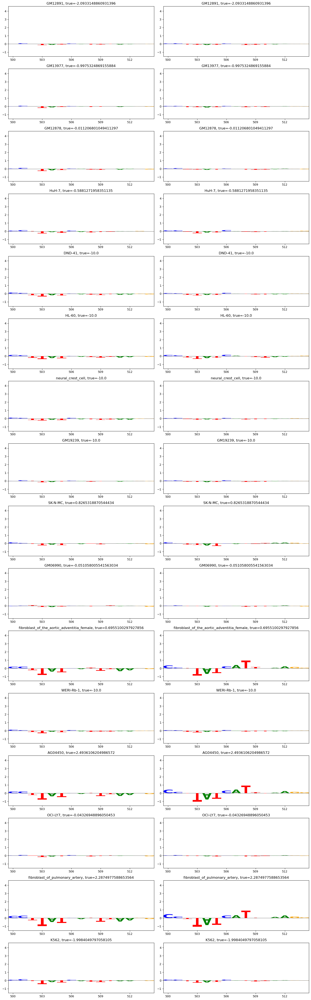

In [112]:
#this was a major tangent, back to the blood
start = 500
end = 515
cell_idxs = [11, 14, 54, 24, 156, 154, 153, 17, 95, 51, 43, 114, 39, 137, 74, 83]
celltype_compare_logo([mult,ctst],idx, cell_idxs, [ism_mult.sum(0), ism.sum(0)], startend=(start,end), true_values = true_values)

In [ ]:
#yeah, this is not great by any means, so we'll just say that this gata example isn't good, even tho it was supposed to be?? let's ensure we do it right